In [2]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import pymannkendall as mk
from plotly.offline import plot
import contextily as cx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import hydrobr
import datetime
import tqdm as tqdm
import warnings
warnings.simplefilter(action='ignore', category=Warning)

In [3]:
import fillinggapsts as fillinggapsts
help(fillinggapsts)

Help on module fillinggapsts:

NAME
    fillinggapsts - Created on Fri Mar 18 09:51:03 2022

DESCRIPTION
    @author: Thiago Nascimento
    Code developed for filling missing data in time-series using multiple linear regression (MLR)
    In this code we take into consideration the t-statistic value >= 2

FUNCTIONS
    fillgapslr(nonfilleddata: pandas.core.frame.DataFrame, coords: pandas.core.frame.DataFrame, filtaux=<class 'pandas.core.frame.DataFrame'>, work_w_filter=True, Use_distance=True, nummaxcorrec=50, Use_t=True)
        Function to fill the gaps of time-series (originally rainfall) based on LR (multiple or single):
            
        Inputs
        ------------------
        nonfilleddata: dataframe[n x y]: 
            Dataframe with the time-series to be filled. Gaps should be stored as np.nan, 
            each column representing one point (e.g., rain-gauges, wells), with unique codes, and the index must be set as as datetime.
        
        coords: dataframe[y x 2]: 


In [4]:
import geospatialfunctions as gf
help(gf)

Help on module geospatialfunctions:

NAME
    geospatialfunctions - Created on Fri Feb 24 10:50:33 2023

DESCRIPTION
    @author: Thiago Nascimento
    Module with some usefull geospatial functions widely used for data-analysis.

FUNCTIONS
    plotboxplots(numr, numc, datatoplot: pandas.core.frame.DataFrame, setylim=False, ymin=0, ymax=1, figsizeproj=(18, 11), ylabelplot='P (mm)')
        Inputs
        ------------------
        numr = Number of rows of your figure;
        numc = Numer of columns of your figure;
        datatoplot: dataframe[Index = Datetime; columns = [rain-gauges]]: 
        
        setylim = It is used when one needs to set a common y-lim for the graphs;
        ymin and ymax = only used when "setylim" is "True";
        figsizeproj = size of the generated figure in inches;
        ylabelplot = label of the time-series (assuming all time series are in the same units and type);
        
        Returns
        --------------------
        plt.plot: Boxplot.
    
 

#### Function's definition:

At this part we can define some functions that will be usefull for this notebook:

#### 4. Threshould automatic computation:


##### Now we can automatize the system to select stations with problems in the form of a function so-called "computethreshoulds":
    
We will define the maximum threshould for daily basis based on the consecutive differences in the quantiles, i.e., suden differences are an indicative of a problem. 
After trial and error, we found the rule to identify a probelem as:

1. Any state with consecutive differences above 50% between quantiles;
2. Any state with a difference between max and P99 above 50 mm.

Here we will define and use the function so-called "computethreshoulds" as defined below:

In [5]:
def computethreshoulds(stationsdescribe, maxdiffpercentage = 50.0, maxdiffinmm = 50.0):

    # First we compute the differences between the percentiles in (mm):
    diffstationsdescribe = stationsdescribe.loc[:, ["P25", "P50", "P75", "P90", "P95", "P99", "max"]].diff(axis=1)
    
    # Now we can compute the differences in (%):
    diffpercstationsdescribe = (diffstationsdescribe / stationsdescribe.loc[:, ["P25", "P25", "P50", "P75", "P90", "P95", "P99"]].values)*100
    diffpercstationsdescribe["maxdiff"] = diffpercstationsdescribe.T.max()

    
    # Now we define the part of the function which computes the threshoulds:
    for state in stationsdescribe.index:
        if diffpercstationsdescribe.loc[state, "maxdiff"] >= maxdiffpercentage or diffstationsdescribe.loc[state, "max"] >= maxdiffinmm:

            if diffpercstationsdescribe.loc[state, "P50"] >= maxdiffpercentage:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P50"] 

            elif diffpercstationsdescribe.loc[state, "P75"] >= maxdiffpercentage:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P50"] 

            elif diffpercstationsdescribe.loc[state, "P90"] >= maxdiffpercentage:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P75"] 

            elif diffpercstationsdescribe.loc[state, "P95"] >= maxdiffpercentage:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P90"] 

            elif diffpercstationsdescribe.loc[state, "P99"] >= maxdiffpercentage:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P95"]

            else:
                stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "P99"] 
        
        else:
            stationsdescribe.loc[state, "threshould"] =  stationsdescribe.loc[state, "max"]  
    
    return diffstationsdescribe, diffpercstationsdescribe, stationsdescribe

//////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

Now we start loading our data:

In [6]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\dailydata.csv'
dailydata = pd.read_csv(path, index_col = [0])
dailydata.index = pd.to_datetime(dailydata.index)
dailydata

,00047002,00047003,00047004,00048006,00051002,00052000,00060000,00061000,00063000,00065001,...,08359000,08360000,08360002,08360003,08361000,08361001,08361004,08363000,08460001,08461000
1900-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
dailydata2 = dailydata.loc['1981-01-01':'2021-12-31']
dailydata2.index.name = 'dates'
dailydata2

,00047002,00047003,00047004,00048006,00051002,00052000,00060000,00061000,00063000,00065001,...,08359000,08360000,08360002,08360003,08361000,08361001,08361004,08363000,08460001,08461000
dates,,,,,,,,,,,,,,,,,,,,,
1981-01-01,12.1,NaN,NaN,NaN,0.5,0.2,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-02,NaN,NaN,NaN,NaN,0.0,0.7,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-03,NaN,NaN,NaN,NaN,0.2,4.2,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-04,NaN,NaN,NaN,NaN,3.3,2.6,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-05,NaN,NaN,NaN,NaN,25.0,8.6,NaN,8.3,2.2,NaN,...,NaN,0.2,0.0,NaN,0.0,7.2,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.0,0.0,7.2,0.0,0.0,NaN,0.4,0.0,0.0,0.0,...,7.5,0.0,0.0,0.0,0.0,0.0,0.8,NaN,0.0,2.3
2021-12-28,0.0,0.0,5.2,0.0,0.0,NaN,0.2,0.7,0.0,9.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,14.5
2021-12-29,0.0,0.0,0.0,0.0,6.9,NaN,3.7,0.6,29.5,0.0,...,18.7,0.0,0.0,0.0,9.8,0.0,0.0,NaN,0.0,0.0


In [8]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\stationsinfos.xlsx'
stationsinfos = pd.read_excel(path, usecols = [1,2,5,6,8,9], index_col = 1)

In [9]:
stationsinfos

,Name,City,State,Latitude,Longitude
Code,,,,,
47000,SALINÓPOLIS,SALINÓPOLIS,PARÁ,-0.6500,-47.5500
47002,SALINÓPOLIS,SALINÓPOLIS,PARÁ,-0.6231,-47.3536
47003,CURUÇA,CURUÇA,PARÁ,-0.7375,-47.8536
47004,PRIMAVERA,PRIMAVERA,PARÁ,-0.9294,-47.0994
47005,MARUDA,MARAPANIM,PARÁ,-0.6336,-47.6583
...,...,...,...,...,...
8461000,NOVA ESPERANÇA/MARCO BV-8,PACARAIMA,RORAIMA,4.4883,-61.1297
8464001,MISSÃO AUARIS - JUSANTE,BOA VISTA,RORAIMA,4.0031,-64.4431
8555060,WILLIAM KRAANPLEIN,SURINAME,SURINAME,5.8000,-55.1667


In [10]:
stationsused = pd.DataFrame(index = dailydata.columns.astype(int), columns = ["Longitude", "Latitude"])
stationsused["Latitude"], stationsused["Longitude"] = stationsinfos["Latitude"], stationsinfos["Longitude"]
stationsused

,Longitude,Latitude
47002,-47.3536,-0.6231
47003,-47.8536,-0.7375
47004,-47.0994,-0.9294
48006,-48.1103,-0.8681
51002,-51.4203,-0.3992
...,...,...
8361001,-61.2881,3.2906
8361004,-61.0883,3.2872
8363000,-63.1692,3.5497
8460001,-60.7939,4.1961


We have to adjust the codes, because for the filling time-series the columns are stored as a str with 0s before the numbers, and at the Code they are just number.

In [11]:
stationsused["Code"] = dailydata2.columns
stationsused.reset_index(drop=True)
stationsused.set_index(['Code'], inplace = True)
stationsused

,Longitude,Latitude
Code,,
00047002,-47.3536,-0.6231
00047003,-47.8536,-0.7375
00047004,-47.0994,-0.9294
00048006,-48.1103,-0.8681
00051002,-51.4203,-0.3992
...,...,...
08361001,-61.2881,3.2906
08361004,-61.0883,3.2872
08363000,-63.1692,3.5497


In [12]:
dailydata2.head()

,00047002,00047003,00047004,00048006,00051002,00052000,00060000,00061000,00063000,00065001,...,08359000,08360000,08360002,08360003,08361000,08361001,08361004,08363000,08460001,08461000
dates,,,,,,,,,,,,,,,,,,,,,
1981-01-01,12.1,NaN,NaN,NaN,0.5,0.2,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-02,NaN,NaN,NaN,NaN,0.0,0.7,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-03,NaN,NaN,NaN,NaN,0.2,4.2,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-04,NaN,NaN,NaN,NaN,3.3,2.6,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1981-01-05,NaN,NaN,NaN,NaN,25.0,8.6,NaN,8.3,2.2,NaN,...,NaN,0.2,0.0,NaN,0.0,7.2,0.0,NaN,NaN,NaN


#### Compute the percentage of failures:

In [13]:
summarygapsstations = fillinggapsts.summarygaps(dailydata2, stationsused)
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps
Code,,,,
00047002,-47.3536,-0.6231,725.0,4.841402
00047003,-47.8536,-0.7375,694.0,4.634391
00047004,-47.0994,-0.9294,598.0,3.993322
00048006,-48.1103,-0.8681,646.0,4.313856
00051002,-51.4203,-0.3992,866.0,5.782972
...,...,...,...,...
08361001,-61.2881,3.2906,146.0,0.974958
08361004,-61.0883,3.2872,205.0,1.368948
08363000,-63.1692,3.5497,3282.0,21.916528


#### Plot figures with percentage of failures:

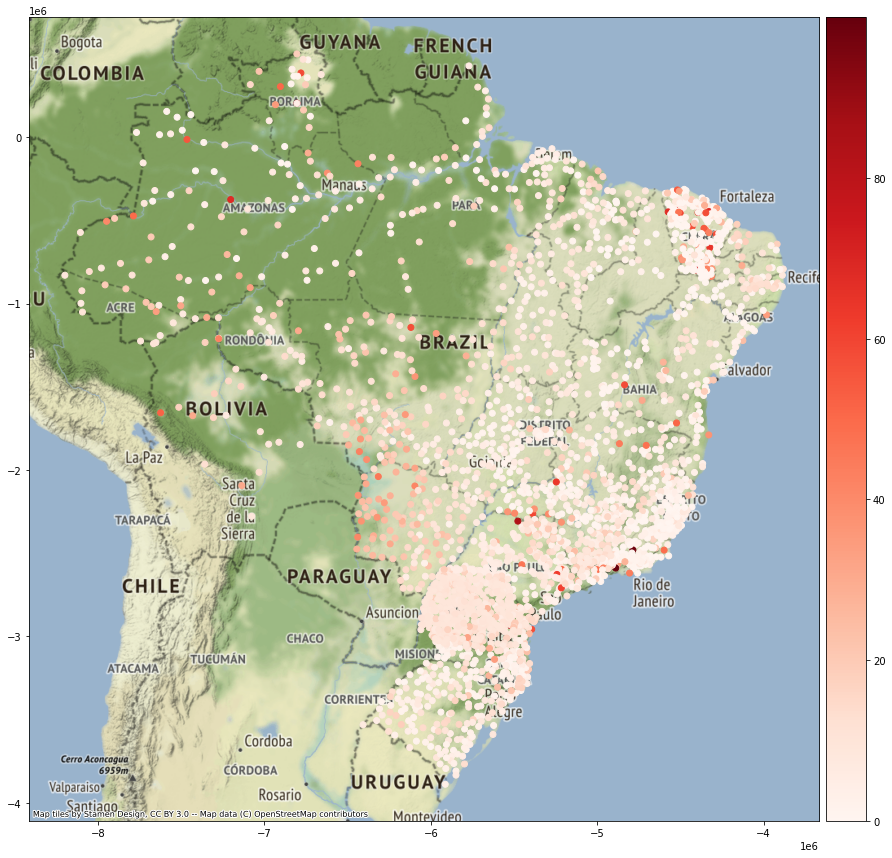

In [14]:
fillinggapsts.plotgaps(summarygapsstations, crsproj = 'epsg:4326', backmapproj = True)

#### Plot only the gauges with a further filter (e.g., Percentage of gaps < 10 %):

In [15]:
summarygapsstationsnew = summarygapsstations[summarygapsstations.PercentageGaps < 10]

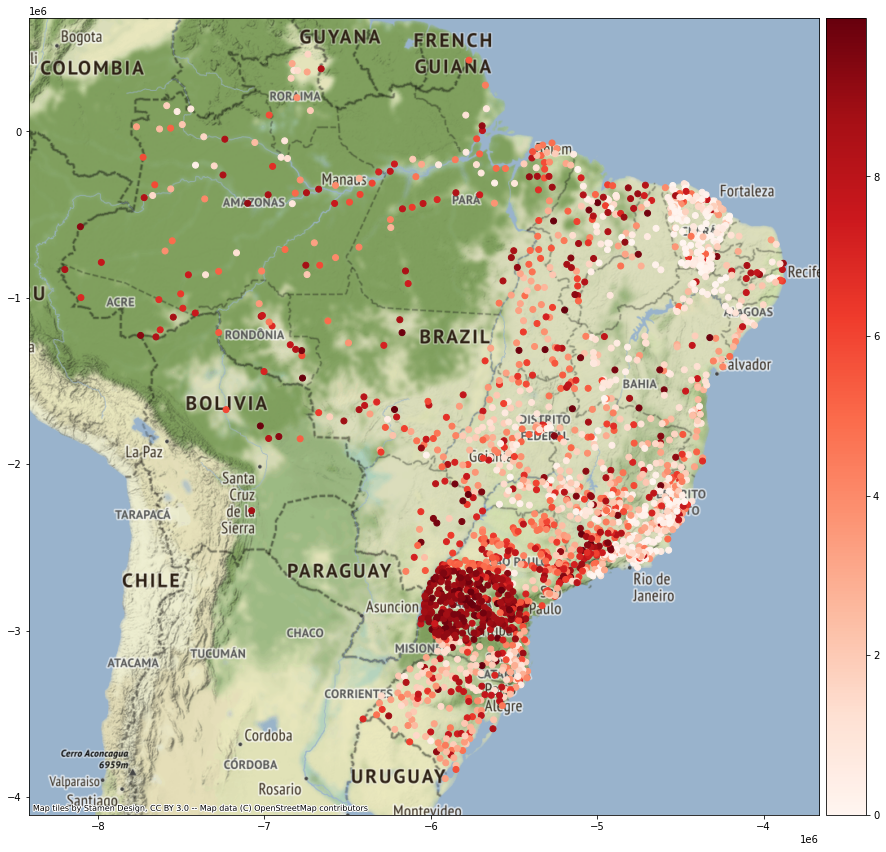

In [16]:
fillinggapsts.plotgaps(summarygapsstationsnew, crsproj = 'epsg:4326', backmapproj = True)

Defining a filter:

In this case we are working with 10% of failures, from 1981 onwards, therefore, 1898 gauges.

In [17]:
filtaux = pd.DataFrame(data = summarygapsstations.index[summarygapsstations.PercentageGaps < 10])

In [18]:
summarygapsstationsnew

,CoordX,CoordY,NumGaps,PercentageGaps,geometry
Code,,,,,
00047002,-47.3536,-0.6231,725.0,4.841402,POINT (-47.35360 -0.62310)
00047003,-47.8536,-0.7375,694.0,4.634391,POINT (-47.85360 -0.73750)
00047004,-47.0994,-0.9294,598.0,3.993322,POINT (-47.09940 -0.92940)
00048006,-48.1103,-0.8681,646.0,4.313856,POINT (-48.11030 -0.86810)
00051002,-51.4203,-0.3992,866.0,5.782972,POINT (-51.42030 -0.39920)
...,...,...,...,...,...
08360000,-60.5289,4.1667,243.0,1.622705,POINT (-60.52890 4.16670)
08360002,-60.5711,3.2078,481.0,3.212020,POINT (-60.57110 3.20780)
08361000,-61.3839,3.6608,477.0,3.185309,POINT (-61.38390 3.66080)


In [19]:
summarygapsstationsnew.NumGaps.sum()

1253634.0

In [20]:
dailydata3 = dailydata2.loc[:, filtaux.Code]

In [21]:
stationsinfos

,Name,City,State,Latitude,Longitude
Code,,,,,
47000,SALINÓPOLIS,SALINÓPOLIS,PARÁ,-0.6500,-47.5500
47002,SALINÓPOLIS,SALINÓPOLIS,PARÁ,-0.6231,-47.3536
47003,CURUÇA,CURUÇA,PARÁ,-0.7375,-47.8536
47004,PRIMAVERA,PRIMAVERA,PARÁ,-0.9294,-47.0994
47005,MARUDA,MARAPANIM,PARÁ,-0.6336,-47.6583
...,...,...,...,...,...
8461000,NOVA ESPERANÇA/MARCO BV-8,PACARAIMA,RORAIMA,4.4883,-61.1297
8464001,MISSÃO AUARIS - JUSANTE,BOA VISTA,RORAIMA,4.0031,-64.4431
8555060,WILLIAM KRAANPLEIN,SURINAME,SURINAME,5.8000,-55.1667


In [22]:
stationsall = pd.DataFrame(index = dailydata.columns.astype(int), columns = ["Longitude", "Latitude", "State", "City", "Name"])
stationsall["Latitude"], stationsall["Longitude"], stationsall["State"], stationsall["City"], stationsall["Name"] = stationsinfos["Latitude"], stationsinfos["Longitude"], stationsinfos["State"], stationsinfos["City"], stationsinfos["Name"]
stationsall["Code"] = dailydata.columns
stationsall.reset_index(drop=True)
stationsall.set_index(['Code'], inplace = True)
stationsall

,Longitude,Latitude,State,City,Name
Code,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00047004,-47.0994,-0.9294,PARÁ,PRIMAVERA,PRIMAVERA
00048006,-48.1103,-0.8681,PARÁ,VIGIA,VIGIA
00051002,-51.4203,-0.3992,AMAPÁ,MAZAGÃO,NAVIO
...,...,...,...,...,...
08361001,-61.2881,3.2906,RORAIMA,ALTO ALEGRE,BOQUEIRÃO
08361004,-61.0883,3.2872,RORAIMA,ALTO ALEGRE,COLÔNIA DO TAIANO
08363000,-63.1692,3.5497,RORAIMA,ALTO ALEGRE,UAICÁS


In [23]:
stationsused = pd.DataFrame(index = dailydata3.columns.astype(int), columns = ["Longitude", "Latitude", "State", "City", "Name"])
stationsused["Latitude"], stationsused["Longitude"], stationsused["State"], stationsused["City"], stationsused["Name"] = stationsinfos["Latitude"], stationsinfos["Longitude"], stationsinfos["State"], stationsinfos["City"], stationsinfos["Name"]

stationsused["Code"] = dailydata3.columns
stationsused.reset_index(drop=True)
stationsused.set_index(['Code'], inplace = True)
stationsused

,Longitude,Latitude,State,City,Name
Code,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00047004,-47.0994,-0.9294,PARÁ,PRIMAVERA,PRIMAVERA
00048006,-48.1103,-0.8681,PARÁ,VIGIA,VIGIA
00051002,-51.4203,-0.3992,AMAPÁ,MAZAGÃO,NAVIO
...,...,...,...,...,...
08360000,-60.5289,4.1667,RORAIMA,PACARAIMA,MALOCA DO CONTÃO
08360002,-60.5711,3.2078,RORAIMA,BOA VISTA,FAZENDA PASSARÃO
08361000,-61.3839,3.6608,RORAIMA,AMAJARI,FAZENDA SÃO JOÃO


#### At this part we check the data for potential measurement errors:

In [24]:
dailydata3 = dailydata2.loc[:, filtaux.Code]

In [25]:
#monthdata3 = dailydata3.resample('M').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

In [26]:
#annualdata3 = dailydata3.resample('Y').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

At this part we can save the data, and read it next time we need to use it, so we save sime time:

In [27]:
#dailydata3.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\dailydata3.csv')  
#monthdata3.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata3.csv')  
#annualdata3.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata3.csv')  

In [28]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata3.csv'
monthdata3 = pd.read_csv(path, index_col = [0])
monthdata3.index = pd.to_datetime(monthdata3.index)

path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata3.csv'
annualdata3 = pd.read_csv(path, index_col = [0])
annualdata3.index = pd.to_datetime(annualdata3.index)
annualdata3.head()

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
dates,,,,,,,,,,,,,,,,,,,,,
1981-12-31,NaN,NaN,NaN,NaN,1941.5,1784.5,1894.4,NaN,1450.7,NaN,...,3123.0,3814.9,2304.2,2990.9,NaN,NaN,NaN,448.8,NaN,NaN
1982-12-31,2578.7,2944.2,NaN,NaN,2564.7,2465.9,1963.4,NaN,1760.0,NaN,...,3164.7,3860.2,1962.2,3412.2,NaN,NaN,NaN,1700.3,1536.3,1580.8
1983-12-31,1315.6,2989.0,1296.7,1597.0,2027.4,2378.3,2034.9,2012.6,NaN,1608.7,...,2984.2,2569.6,1848.3,2370.2,NaN,1058.6,936.1,NaN,NaN,822.1
1984-12-31,3216.3,6861.0,2938.2,2899.4,2414.7,2246.8,2367.4,2957.0,1796.1,2568.2,...,3650.3,4697.5,1954.7,3243.1,NaN,1897.0,NaN,NaN,1872.3,1110.2
1985-12-31,3902.5,13266.3,4224.8,3836.4,2777.6,1783.6,1811.7,2540.7,1913.9,3046.1,...,3190.6,4074.7,1635.2,2954.5,1611.4,1547.5,1112.1,1997.6,1617.2,NaN


Check for rows which present values above a specific value:

In [29]:
# Conditions daily:
idcondition = dailydata3.T[(dailydata3.T > 400).any(axis=1)].index.tolist()
stationscondition = stationsused.loc[idcondition]

# Conditions monthly:
idconditionmon = monthdata3.T[(monthdata3.T > 1200).any(axis=1)].index.tolist()
stationsconditionmon = stationsused.loc[idconditionmon]

# Conditions annual:
idconditionann = annualdata3.T[(annualdata3.T > 5500).any(axis=1)].index.tolist()
stationsconditionann = stationsused.loc[idconditionann]

In [30]:
stationscondition

,Longitude,Latitude,State,City,Name
Code,,,,,
00147007,-47.9394,-1.2975,PARÁ,CASTANHAL,CASTANHAL
00254000,-54.7025,-2.4433,PARÁ,SANTARÉM,SANTARÉM
00359001,-59.0897,-3.8847,AMAZONAS,NOVA OLINDA DO NORT,NOVA OLINDA DO NORTE
00363000,-63.7858,-3.8750,AMAZONAS,COARI,BARRO ALTO - SÂO RAIMUNDO DO IPIXUNA
00366000,-66.1031,-3.6414,AMAZONAS,JURUÁ,FORTE DAS GRAÇAS
...,...,...,...,...,...
02849001,-49.2950,-28.3589,SANTA CATARINA,ORLEANS,ORLEANS - MONTANTE
02849002,-49.1792,-28.3258,SANTA CATARINA,SÃO LUDGERO,SÃO LUDGERO I
03152016,-52.4631,-31.5739,RIO GRANDE DO SUL,PELOTAS,PONTE CORDEIRO DE FARIAS


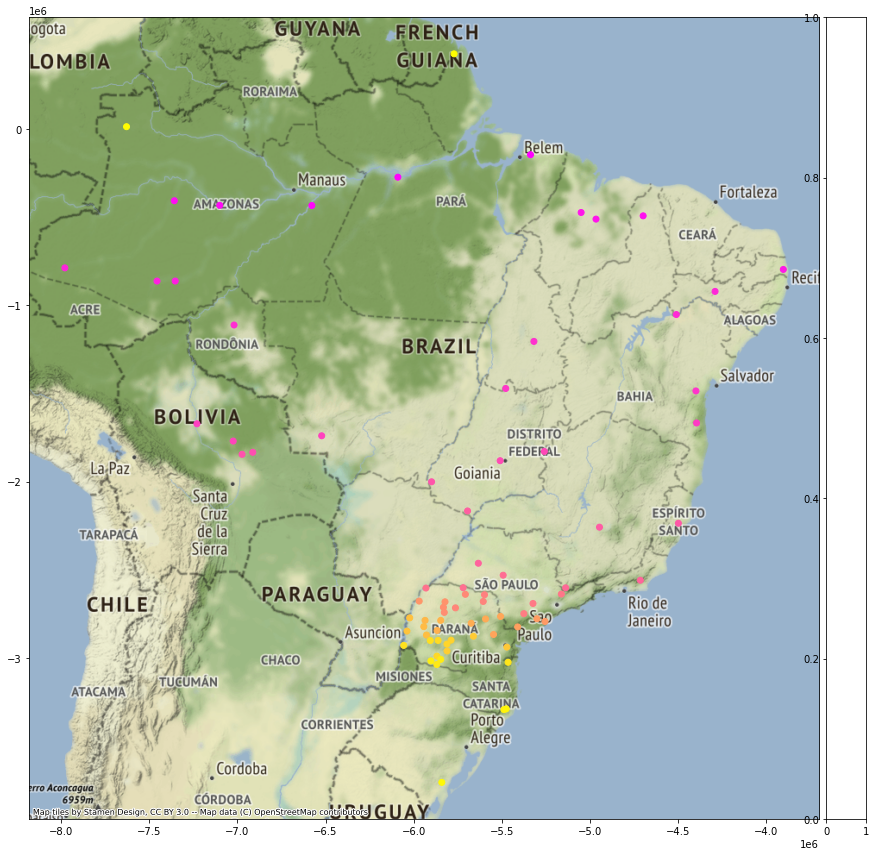

In [31]:
gf.plotpoints(stationscondition)

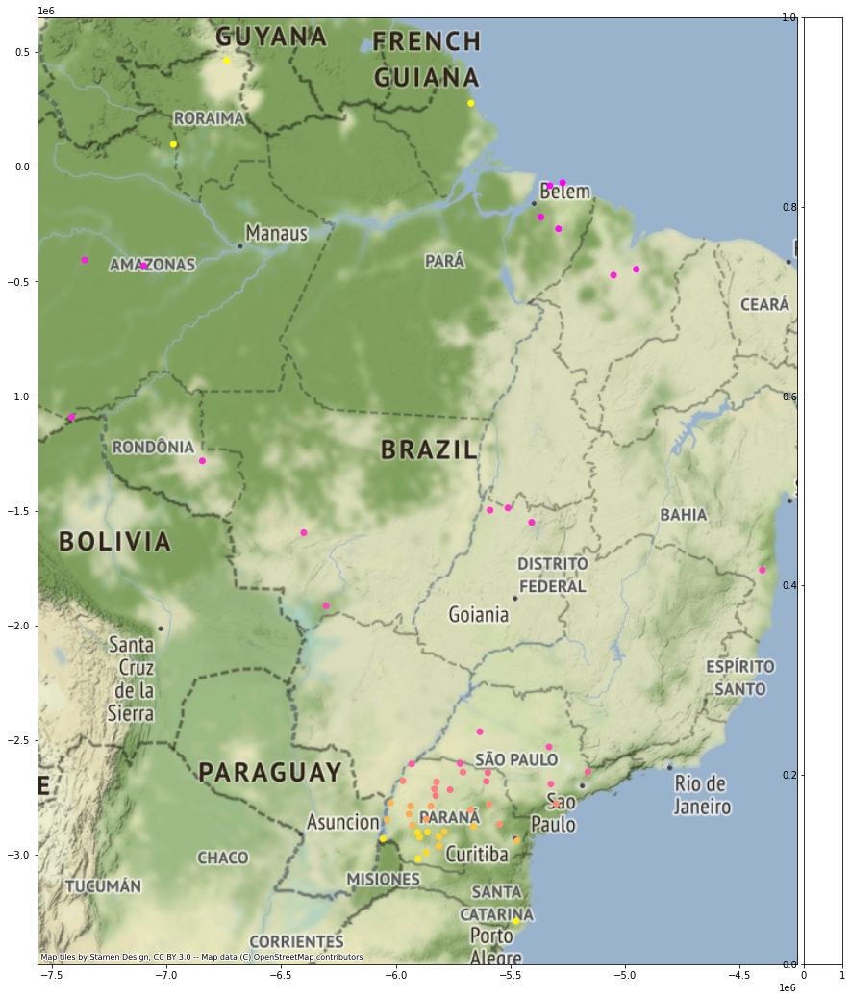

In [32]:
gf.plotpoints(stationsconditionmon)

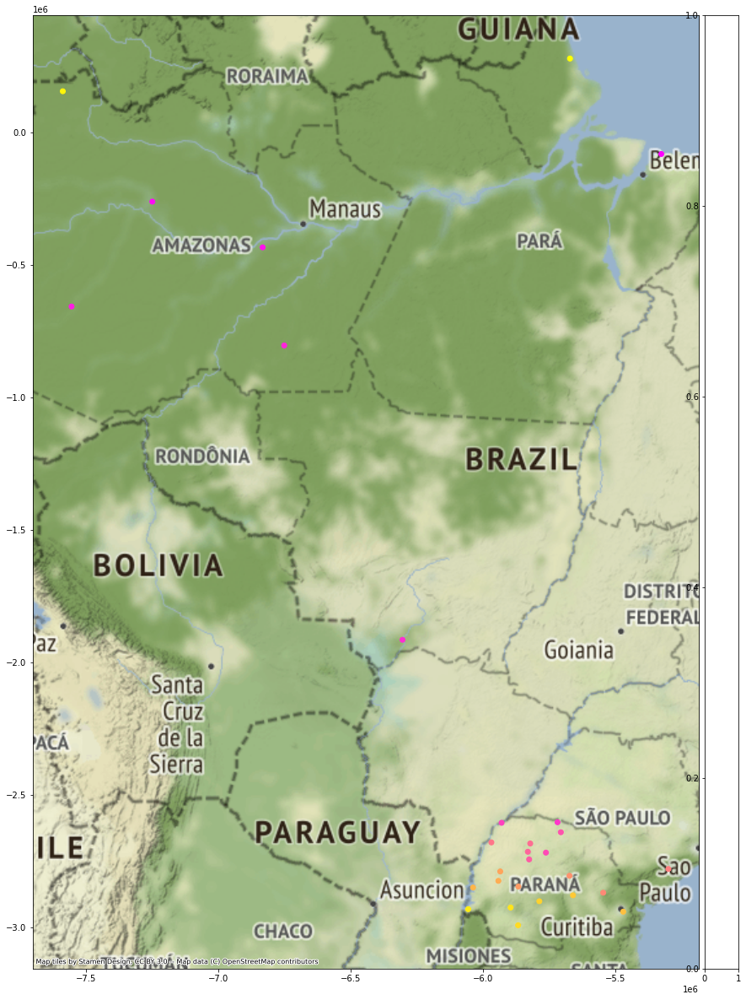

In [33]:
gf.plotpoints(stationsconditionann)

In [34]:
print("The total number of gauges presenting potential 'outliers' is: Daily:", len(stationscondition), "Monthly:", len(stationsconditionmon), "Annual:", len(stationsconditionann)) 

The total number of gauges presenting potential 'outliers' is: Daily: 79 Monthly: 56 Annual: 29


We can more or less visualize it:

In [35]:
indexestoplot = stationscondition.index.tolist()[:]

<AxesSubplot:xlabel='dates'>

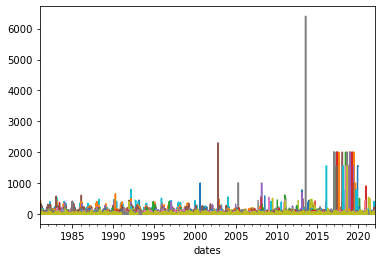

In [36]:
dailydata3.loc[:, stationscondition.index.tolist()[:]].plot(legend= False)

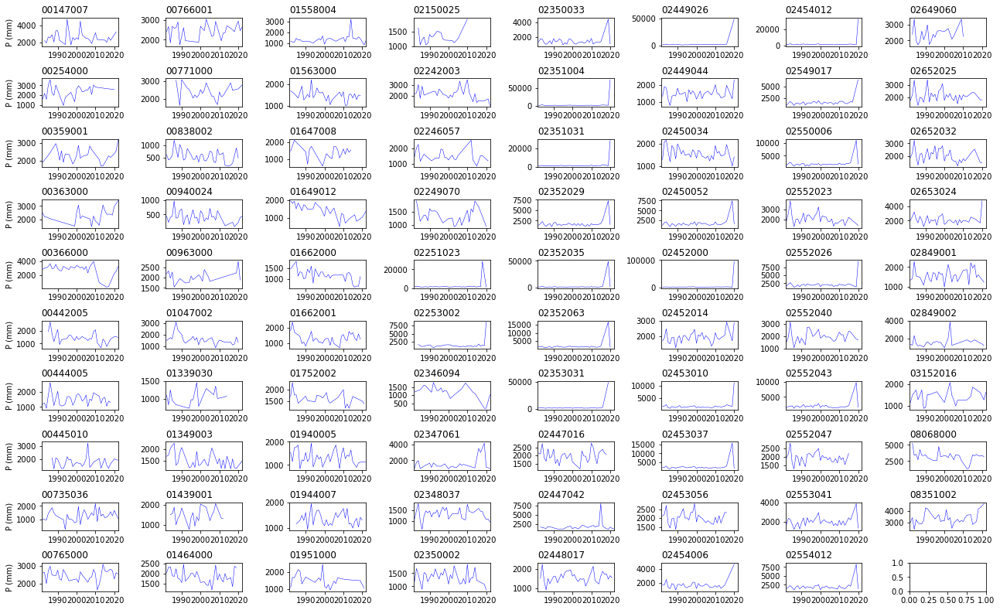

In [37]:
gf.plottimeseries(numr = 10, numc = 8, datatoplot = annualdata3.loc[:, indexestoplot], 
                  setylim = False, ymin = 0, ymax = 1, figsizeproj = (18, 11),
                  colorgraph = "blue", linewidthproj = 0.5, linestyleproj = "-",  
                  ylabelplot = "P (mm)", datestart = datetime.date(1981, 6, 1), 
                  dateend = datetime.date(2021, 12, 31), 
                  setnumberofintervals = True, numberintervals = 10)

<AxesSubplot:xlabel='dates'>

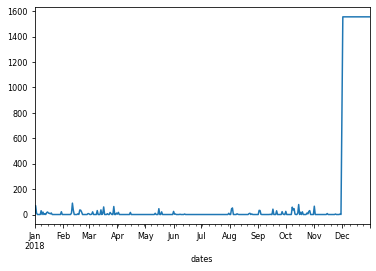

In [38]:
dailydata3.loc["2018":"2018", "02353031"].plot()

In [39]:
dailydata3.loc["2018-12-01":, "02353031"].head()

dates
2018-12-01     777.7
2018-12-02    1555.4
2018-12-03    1555.4
2018-12-04    1555.4
2018-12-05    1555.4
Name: 02353031, dtype: float64

#### Now we can check the maximum daily precipitation per states:

In [40]:
fsummary = dailydata3.describe()
fsummary

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
count,14250.000000,14281.000000,14377.000000,14329.000000,14109.000000,14837.00000,14607.000000,13713.000000,14739.000000,14504.000000,...,14701.000000,14315.000000,14705.000000,14158.000000,13731.000000,14732.000000,14494.000000,14498.000000,14829.000000,14770.000000
mean,7.868971,8.983834,7.252928,7.555564,5.312576,6.90550,6.109374,6.599153,6.491031,5.623683,...,10.928563,11.719183,5.317084,9.103934,4.457503,5.070641,3.626485,5.048192,4.819880,4.750527
std,17.994631,19.336736,15.099436,14.018732,11.183609,13.20176,13.473686,12.392351,14.230833,10.859411,...,17.148861,21.653922,11.799956,16.172487,11.674168,13.167364,10.715302,12.155737,12.116313,12.156050
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.700000,0.000000,0.40000,0.000000,0.700000,0.000000,0.100000,...,2.600000,2.500000,0.000000,1.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.800000,9.000000,7.900000,9.400000,6.200000,8.50000,6.200000,7.700000,6.200000,7.000000,...,15.400000,13.400000,5.000000,11.700000,0.500000,2.500000,0.000000,3.100000,2.700000,1.800000
max,232.700000,195.800000,151.000000,183.700000,223.000000,305.00000,191.200000,143.400000,142.000000,122.400000,...,256.800000,340.600000,262.200000,482.600000,180.800000,220.100000,153.000000,180.300000,190.400000,184.800000


In [41]:
stationssummary = stationsused.copy()
stationssummary["max"] = fsummary.T["max"]
stationssummary

,Longitude,Latitude,State,City,Name,max
Code,,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS,232.7
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA,195.8
00047004,-47.0994,-0.9294,PARÁ,PRIMAVERA,PRIMAVERA,151.0
00048006,-48.1103,-0.8681,PARÁ,VIGIA,VIGIA,183.7
00051002,-51.4203,-0.3992,AMAPÁ,MAZAGÃO,NAVIO,223.0
...,...,...,...,...,...,...
08360000,-60.5289,4.1667,RORAIMA,PACARAIMA,MALOCA DO CONTÃO,220.1
08360002,-60.5711,3.2078,RORAIMA,BOA VISTA,FAZENDA PASSARÃO,153.0
08361000,-61.3839,3.6608,RORAIMA,AMAJARI,FAZENDA SÃO JOÃO,180.3


In [42]:
stationsdescribe = stationssummary.groupby(by=["State"]).mean()
stationsdescribe.drop(columns=['Longitude', 'Latitude'], inplace = True)
stationsdescribe.rename(columns = {'max':'mean'}, inplace = True)
stationsdescribe["min"] = stationssummary.groupby(by=["State"]).min().iloc[:, 4]
stationsdescribe["P25"] = stationssummary.groupby(by=["State"]).quantile(q = 0.25).iloc[:, 2]
stationsdescribe["P50"] = stationssummary.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
stationsdescribe["P75"] = stationssummary.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
stationsdescribe["P90"] = stationssummary.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
stationsdescribe["P95"] = stationssummary.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
stationsdescribe["P99"] = stationssummary.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
stationsdescribe["max"] = stationssummary.groupby(by=["State"]).max().iloc[:, 4]
stationsdescribe["Q1+1.5IQR"] = stationsdescribe["P25"] + (stationsdescribe["P75"] - stationsdescribe["P25"])*1.5

stationsdescribe

,mean,min,P25,P50,P75,P90,P95,P99,max,Q1+1.5IQR
State,,,,,,,,,,
ACRE,199.616667,130.6,144.800,169.40,213.575,294.15,328.775,356.475,363.4,247.9625
ALAGOAS,129.837500,84.6,103.075,125.15,161.725,168.13,172.365,175.753,176.6,191.0500
AMAPÁ,239.828571,122.6,147.100,215.80,281.800,397.40,440.000,474.080,482.6,349.1500
AMAZONAS,351.189091,113.2,153.400,189.30,235.100,427.58,672.600,3485.108,6401.0,275.9500
BAHIA,169.210417,110.0,135.350,151.05,178.400,214.70,267.225,440.300,446.0,199.9250
BOLÍVIA,500.216667,357.9,389.150,447.80,550.325,681.65,737.675,782.495,793.7,630.9125
CEARÁ,153.606098,85.5,135.950,147.00,165.150,194.70,208.170,233.920,331.4,179.7500
DISTRITO FEDERAL,141.482353,116.6,131.000,132.60,145.800,166.64,179.600,195.920,200.0,153.2000
ESPÍRITO SANTO,182.536486,107.4,146.400,175.60,202.625,233.30,254.485,326.404,403.2,230.7375


Boxtplots:

Here we can plot the boxplots from each state:

In [43]:
stationssummary

,Longitude,Latitude,State,City,Name,max
Code,,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS,232.7
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA,195.8
00047004,-47.0994,-0.9294,PARÁ,PRIMAVERA,PRIMAVERA,151.0
00048006,-48.1103,-0.8681,PARÁ,VIGIA,VIGIA,183.7
00051002,-51.4203,-0.3992,AMAPÁ,MAZAGÃO,NAVIO,223.0
...,...,...,...,...,...,...
08360000,-60.5289,4.1667,RORAIMA,PACARAIMA,MALOCA DO CONTÃO,220.1
08360002,-60.5711,3.2078,RORAIMA,BOA VISTA,FAZENDA PASSARÃO,153.0
08361000,-61.3839,3.6608,RORAIMA,AMAJARI,FAZENDA SÃO JOÃO,180.3


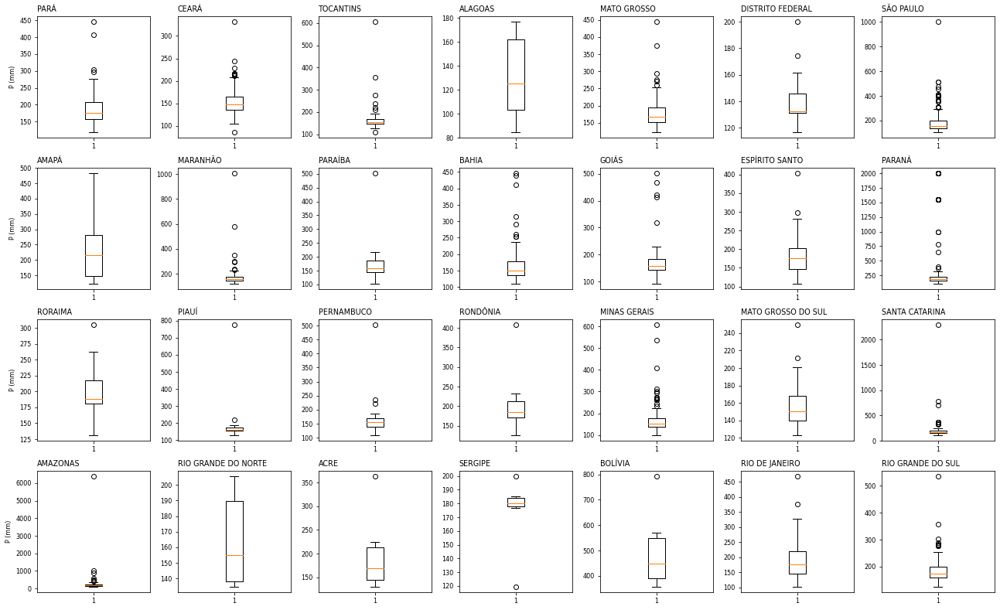

In [48]:
gf.plotboxplots(numr = 4, numc = 7, datatoplot = stationssummary, setylim = False, 
                 ymin = 0, ymax = 1, figsizeproj = (18, 11), ylabelplot = "P (mm)")

Here we can plot the boxplots from each state but defining an unique ylim:

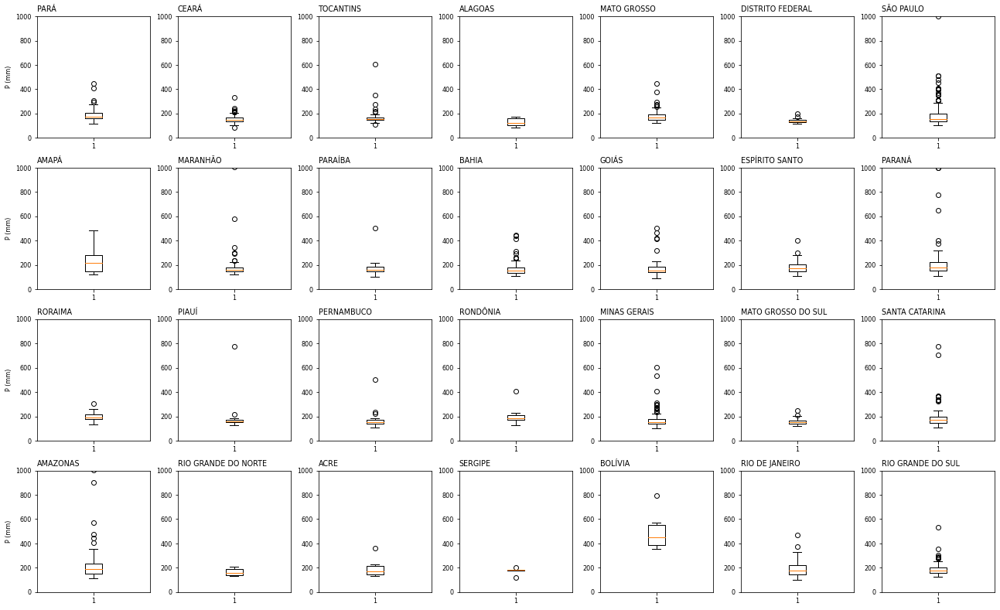

In [48]:
plotboxplots(4, 7, stationssummary, setylim = True, ymin = 0, ymax = 1000)

In [50]:
stationssummary[stationssummary["State"] == "ESPÍRITO SANTO"].head(50)

,Longitude,Latitude,State,City,Name,max
Code,,,,,,
01840000,-40.7461,-18.9856,ESPÍRITO SANTO,ÁGUIA BRANCA,ÁGUIA BRANCA,214.0
01840003,-40.0906,-18.4894,ESPÍRITO SANTO,SÃO MATEUS,ITAUNINHAS,143.6
01840004,-40.8900,-18.7619,ESPÍRITO SANTO,BARRA DE SÃO FRANCI,BARRA DE SÃO FRANCISCO,140.0
01840007,-40.9764,-18.5481,ESPÍRITO SANTO,ÁGUA DOCE DO NORTE,ÁGUA DOCE,224.0
01840010,-40.6906,-18.8097,ESPÍRITO SANTO,NOVA VENÉCIA,CEDROLÂNDIA,201.8
01840012,-40.1439,-18.1456,ESPÍRITO SANTO,MONTANHA,FAZENDA LIMOEIRO,183.1
01840013,-40.8406,-18.3658,ESPÍRITO SANTO,ECOPORANGA,ECOPORANGA,182.5
01840015,-40.6033,-18.2056,ESPÍRITO SANTO,ECOPORANGA,PATRIMÔNIO SANTA LUZIA DO NORTE,166.8
01840016,-40.4642,-18.4942,ESPÍRITO SANTO,NOVA VENÉCIA,PATRIMÔNIO XV,156.3


In [52]:
stationssummary[stationssummary["State"] == "ESPÍRITO SANTO"].max()

Longitude          -39.7944
Latitude           -18.1456
State        ESPÍRITO SANTO
City           ÁGUIA BRANCA
Name           ÁGUIA BRANCA
max                   403.2
dtype: object

In [53]:
stationssummary[stationssummary["max"] == 468.5]

,Longitude,Latitude,State,City,Name,max
Code,,,,,,
02242003,-42.3392,-22.4047,RIO DE JANEIRO,NOVA FRIBURGO,PILLER,468.5


<AxesSubplot:xlabel='dates'>

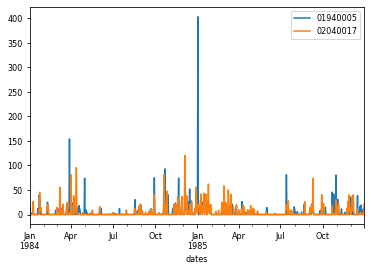

In [54]:
dailydata3.loc["1984":"1985", ["01940005", "02040017"]].plot()

<AxesSubplot:xlabel='dates'>

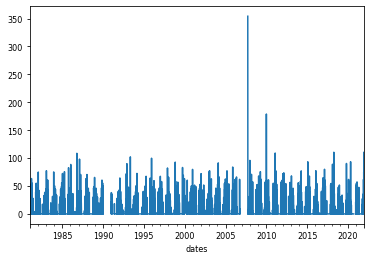

In [55]:
dailydata3.loc[:, "01147003"].plot()

<AxesSubplot:xlabel='dates'>

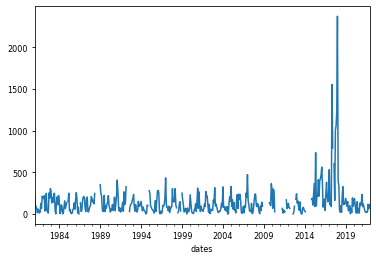

In [56]:
monthdata3.loc[:, "02347061"].plot()

<AxesSubplot:xlabel='dates'>

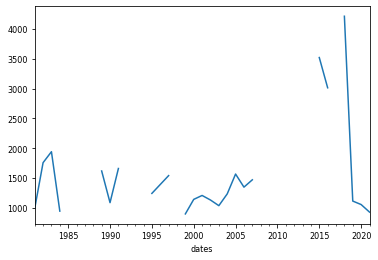

In [57]:
annualdata3.loc[:, "02347061"].plot()

#### First filter:

At this moment we can assume that daily precipitation events > 400 mm can be considered as 'artifacts', since it is a way higher than the maximum historical daily precipitation measurements in Brazil. 

Therefore we may set those values to np.nan.

After that we can resample the data to a monhtly and annually time-scale, and therefore, analyse again for artifacts in the annual and monhtly scale. 

In [58]:
dailydata4 = dailydata3.copy()

Now we can define a filter that will select a threshould maximum for each state, and then, set to np.nan the values above this threshould.

This threshould can be set based on sense + statistical analysis of the maximu, P99 and P95 + visualization of the time-series:

In [59]:
stationsdescribe

,mean,min,P25,P50,P75,P90,P95,P99,max,Q1+1.5IQR
State,,,,,,,,,,
ACRE,199.616667,130.6,144.800,169.40,213.575,294.15,328.775,356.475,363.4,247.9625
ALAGOAS,129.837500,84.6,103.075,125.15,161.725,168.13,172.365,175.753,176.6,191.0500
AMAPÁ,239.828571,122.6,147.100,215.80,281.800,397.40,440.000,474.080,482.6,349.1500
AMAZONAS,351.189091,113.2,153.400,189.30,235.100,427.58,672.600,3485.108,6401.0,275.9500
BAHIA,169.210417,110.0,135.350,151.05,178.400,214.70,267.225,440.300,446.0,199.9250
BOLÍVIA,500.216667,357.9,389.150,447.80,550.325,681.65,737.675,782.495,793.7,630.9125
CEARÁ,153.606098,85.5,135.950,147.00,165.150,194.70,208.170,233.920,331.4,179.7500
DISTRITO FEDERAL,141.482353,116.6,131.000,132.60,145.800,166.64,179.600,195.920,200.0,153.2000
ESPÍRITO SANTO,182.536486,107.4,146.400,175.60,202.625,233.30,254.485,326.404,403.2,230.7375


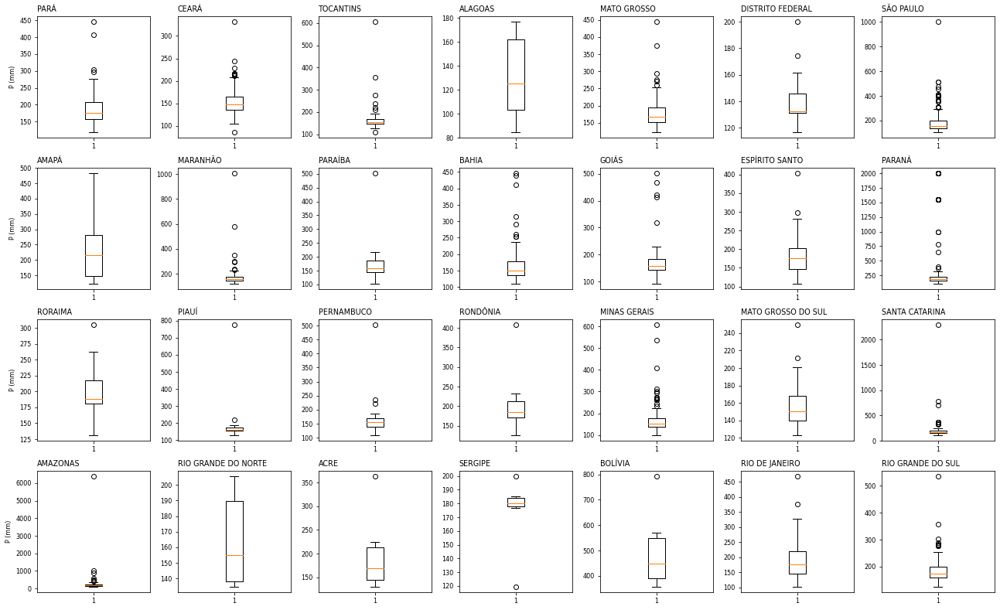

In [60]:
plotboxplots(4, 7, stationssummary)

#### Now we can automatize the system to select stations with problems:
    
We will define the maximum threshould for daily basis based on the consecutive differences in the quantiles, i.e., suden differences are an indicative of a problem. 
After trial and error, we found the rule to identify a probelem as:

1. Any state with consecutive differences above 50% between quantiles;
2. Any state with a difference between max and P99 above 50 mm.

#### (1) Consecutive differences:

In [61]:
diffstationsdescribe = stationsdescribe.loc[:, ["P25", "P50", "P75", "P90", "P95", "P99", "max"]].diff(axis=1)
diffstationsdescribe

,P25,P50,P75,P90,P95,P99,max
State,,,,,,,
ACRE,NaN,24.600,44.175,80.575,34.625,27.700,6.925
ALAGOAS,NaN,22.075,36.575,6.405,4.235,3.388,0.847
AMAPÁ,NaN,68.700,66.000,115.600,42.600,34.080,8.520
AMAZONAS,NaN,35.900,45.800,192.480,245.020,2812.508,2915.892
BAHIA,NaN,15.700,27.350,36.300,52.525,173.075,5.700
BOLÍVIA,NaN,58.650,102.525,131.325,56.025,44.820,11.205
CEARÁ,NaN,11.050,18.150,29.550,13.470,25.750,97.480
DISTRITO FEDERAL,NaN,1.600,13.200,20.840,12.960,16.320,4.080
ESPÍRITO SANTO,NaN,29.200,27.025,30.675,21.185,71.919,76.796


#### (2) Percentage of consecutive differences:

In [62]:
diffpercstationsdescribe = (diffstationsdescribe / stationsdescribe.loc[:, ["P25", "P25", "P50", "P75", "P90", "P95", "P99"]].values)*100
diffpercstationsdescribe["maxdiff"] = diffpercstationsdescribe.T.max()
diffpercstationsdescribe

,P25,P50,P75,P90,P95,P99,max,maxdiff
State,,,,,,,,
ACRE,NaN,16.988950,26.077332,37.726794,11.771205,8.425215,1.942633,37.726794
ALAGOAS,NaN,21.416444,29.224930,3.960427,2.518884,1.965596,0.481926,29.224930
AMAPÁ,NaN,46.702923,30.583874,41.022001,10.719678,7.745455,1.797165,46.702923
AMAZONAS,NaN,23.402868,24.194400,81.871544,57.303896,418.154624,83.667192,418.154624
BAHIA,NaN,11.599557,18.106587,20.347534,24.464369,64.767518,1.294572,64.767518
BOLÍVIA,NaN,15.071309,22.895266,23.863172,8.219027,6.075846,1.431958,23.863172
CEARÁ,NaN,8.127988,12.346939,17.892825,6.918336,12.369698,41.672367,41.672367
DISTRITO FEDERAL,NaN,1.221374,9.954751,14.293553,7.777244,9.086860,2.082483,14.293553
ESPÍRITO SANTO,NaN,19.945355,15.390091,15.138803,9.080583,28.260605,23.527898,28.260605


Now we define a loop to get the daily threshould:

In [63]:
for state in stationsdescribe.index:
    if diffpercstationsdescribe.loc[state, "maxdiff"] >= 50 or diffstationsdescribe.loc[state, "max"] >= 50:
        
        if diffpercstationsdescribe.loc[state, "P50"] >= 50:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P50"] 
        
        elif diffpercstationsdescribe.loc[state, "P75"] >= 50:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P50"] 

        elif diffpercstationsdescribe.loc[state, "P90"] >= 50:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P75"] 

        elif diffpercstationsdescribe.loc[state, "P95"] >= 50:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P90"] 
 
        elif diffpercstationsdescribe.loc[state, "P99"] >= 50:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P95"]
            
        else:
            stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "P99"] 
    else:
        stationsdescribe.loc[state, "dailythres"] =  stationsdescribe.loc[state, "max"]  
stationsdescribe

,mean,min,P25,P50,P75,P90,P95,P99,max,Q1+1.5IQR,dailythres
State,,,,,,,,,,,
ACRE,199.616667,130.6,144.800,169.40,213.575,294.15,328.775,356.475,363.4,247.9625,363.400
ALAGOAS,129.837500,84.6,103.075,125.15,161.725,168.13,172.365,175.753,176.6,191.0500,176.600
AMAPÁ,239.828571,122.6,147.100,215.80,281.800,397.40,440.000,474.080,482.6,349.1500,482.600
AMAZONAS,351.189091,113.2,153.400,189.30,235.100,427.58,672.600,3485.108,6401.0,275.9500,235.100
BAHIA,169.210417,110.0,135.350,151.05,178.400,214.70,267.225,440.300,446.0,199.9250,267.225
BOLÍVIA,500.216667,357.9,389.150,447.80,550.325,681.65,737.675,782.495,793.7,630.9125,793.700
CEARÁ,153.606098,85.5,135.950,147.00,165.150,194.70,208.170,233.920,331.4,179.7500,233.920
DISTRITO FEDERAL,141.482353,116.6,131.000,132.60,145.800,166.64,179.600,195.920,200.0,153.2000,200.000
ESPÍRITO SANTO,182.536486,107.4,146.400,175.60,202.625,233.30,254.485,326.404,403.2,230.7375,326.404


Visually, we can identify that some problems might be happening according to the boxplot (i.e., Paraná, São Paulo, Amazonas), therefore it is needed to solve it manually:

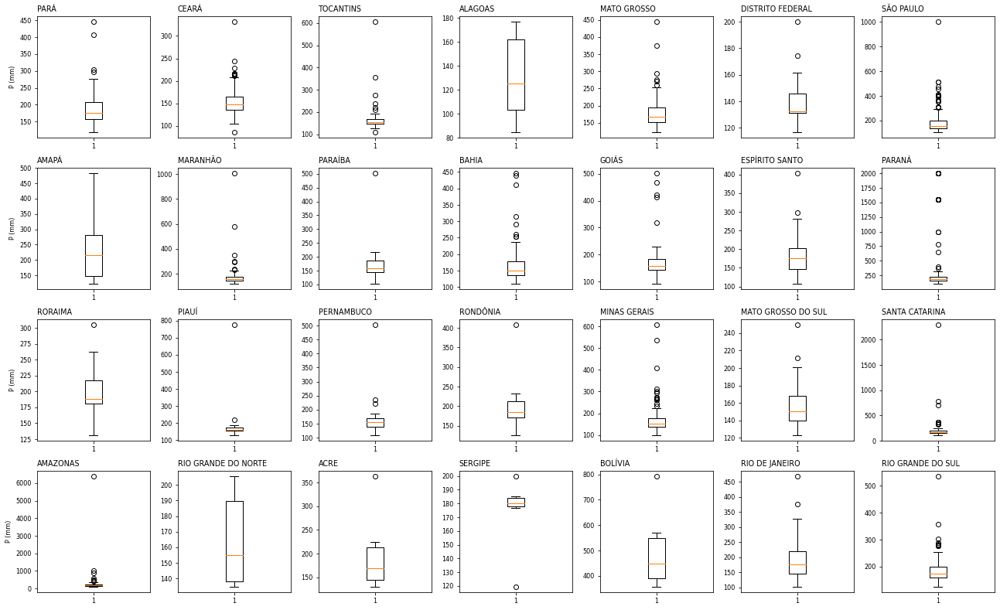

In [64]:
plotboxplots(4, 7, stationssummary)

In [65]:
stationsdescribe.loc["AMAZONAS", "dailythres"] = 427.6
stationsdescribe.loc["GOIÁS", "dailythres"] = 400.0
stationsdescribe.loc["MATO GROSSO", "dailythres"] = stationsdescribe.loc["MATO GROSSO", "P95"]
stationsdescribe.loc["PARANÁ", "dailythres"] = 400.0
stationsdescribe.loc["SÃO PAULO", "dailythres"] = 400.0
stationsdescribe

,mean,min,P25,P50,P75,P90,P95,P99,max,Q1+1.5IQR,dailythres
State,,,,,,,,,,,
ACRE,199.616667,130.6,144.800,169.40,213.575,294.15,328.775,356.475,363.4,247.9625,363.400
ALAGOAS,129.837500,84.6,103.075,125.15,161.725,168.13,172.365,175.753,176.6,191.0500,176.600
AMAPÁ,239.828571,122.6,147.100,215.80,281.800,397.40,440.000,474.080,482.6,349.1500,482.600
AMAZONAS,351.189091,113.2,153.400,189.30,235.100,427.58,672.600,3485.108,6401.0,275.9500,427.600
BAHIA,169.210417,110.0,135.350,151.05,178.400,214.70,267.225,440.300,446.0,199.9250,267.225
BOLÍVIA,500.216667,357.9,389.150,447.80,550.325,681.65,737.675,782.495,793.7,630.9125,793.700
CEARÁ,153.606098,85.5,135.950,147.00,165.150,194.70,208.170,233.920,331.4,179.7500,233.920
DISTRITO FEDERAL,141.482353,116.6,131.000,132.60,145.800,166.64,179.600,195.920,200.0,153.2000,200.000
ESPÍRITO SANTO,182.536486,107.4,146.400,175.60,202.625,233.30,254.485,326.404,403.2,230.7375,326.404


In [66]:
for state in tqdm.tqdm(stationsdescribe.index.tolist()):
    
    stations = stationsused[stationsused["State"] == state].index.tolist()
    stationthres = stationsdescribe.loc[state, "dailythres"] 
      
    dailydata4[dailydata4.loc[:, stations] > stationthres] = np.nan

100%|███████████████████████████████████████████████████| 28/28 [02:51<00:00,  6.14s/it]


Now we can do a sumary again to check the general statistics of our dataset:

In [67]:
fsummary = dailydata4.describe()
stationssummary = stationsused.copy()
stationssummary["max"] = fsummary.T["max"]
stationssummary
stationsdescribe = stationssummary.groupby(by=["State"]).mean()
stationsdescribe.drop(columns=['Longitude', 'Latitude'], inplace = True)
stationsdescribe.rename(columns = {'max':'mean'}, inplace = True)
stationsdescribe["min"] = stationssummary.groupby(by=["State"]).min().iloc[:, 4]
stationsdescribe["P50"] = stationssummary.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
stationsdescribe["P75"] = stationssummary.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
stationsdescribe["P90"] = stationssummary.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
stationsdescribe["P95"] = stationssummary.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
stationsdescribe["P99"] = stationssummary.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
stationsdescribe["max"] = stationssummary.groupby(by=["State"]).max().iloc[:, 4]
stationsdescribe

,mean,min,P50,P75,P90,P95,P99,max
State,,,,,,,,
ACRE,199.616667,130.6,169.40,213.575,294.15,328.775,356.475,363.4
ALAGOAS,129.837500,84.6,125.15,161.725,168.13,172.365,175.753,176.6
AMAPÁ,239.828571,122.6,215.80,281.800,397.40,440.000,474.080,482.6
AMAZONAS,197.481818,113.2,186.20,211.300,267.76,336.030,412.280,422.0
BAHIA,156.931250,98.0,148.55,171.300,200.05,213.350,254.265,259.3
BOLÍVIA,500.216667,357.9,447.80,550.325,681.65,737.675,782.495,793.7
CEARÁ,151.890854,85.5,147.00,165.000,191.40,205.000,216.622,228.0
DISTRITO FEDERAL,141.482353,116.6,132.60,145.800,166.64,179.600,195.920,200.0
ESPÍRITO SANTO,179.755405,107.4,175.60,202.250,231.63,249.790,285.444,298.0


#### Based on this table, at least at daily basis our dataset seems fair all right. Let's keep analysing and filtering.

Now we can resample the data monthly and yearly:

In [64]:
#monthdata4 = dailydata4.resample('M').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

In [65]:
#annualdata4 = dailydata4.resample('Y').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

At this part we can save the data, and read it next time we need to use it, so we save sime time:

In [69]:
#dailydata4.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\dailydata4.csv')  
#monthdata4.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata4.csv')  
#annualdata4.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata4.csv')  

In [70]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata4.csv'
monthdata4 = pd.read_csv(path, index_col = [0])
monthdata4.index = pd.to_datetime(monthdata4.index)

path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata4.csv'
annualdata4 = pd.read_csv(path, index_col = [0])
annualdata4.index = pd.to_datetime(annualdata4.index)
annualdata4.head()

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
dates,,,,,,,,,,,,,,,,,,,,,
1981-12-31,NaN,NaN,NaN,NaN,1941.5,1784.5,1894.4,NaN,1450.7,NaN,...,3123.0,3814.9,2304.2,2990.9,NaN,NaN,NaN,448.8,NaN,NaN
1982-12-31,2578.7,2944.2,NaN,NaN,2564.7,2465.9,1963.4,NaN,1760.0,NaN,...,3164.7,3860.2,1962.2,3412.2,NaN,NaN,NaN,1700.3,1536.3,1580.8
1983-12-31,1315.6,2989.0,1296.7,1597.0,2027.4,2378.3,2034.9,2012.6,NaN,1608.7,...,2984.2,2569.6,1848.3,2370.2,NaN,1058.6,936.1,NaN,NaN,822.1
1984-12-31,3216.3,6861.0,2938.2,2899.4,2414.7,2246.8,2367.4,2957.0,1796.1,2568.2,...,3650.3,4697.5,1954.7,3243.1,NaN,1897.0,NaN,NaN,1872.3,1110.2
1985-12-31,3902.5,13266.3,4224.8,3836.4,2777.6,1783.6,1811.7,2540.7,1913.9,3046.1,...,3190.6,4074.7,1635.2,2954.5,1611.4,1547.5,1112.1,1997.6,1617.2,NaN


And now we can check again our dataset based on the conditions:

In [71]:
# Conditions daily:
idcondition = dailydata4.T[(dailydata4.T > 400).any(axis=1)].index.tolist()
stationscondition = stationsused.loc[idcondition]

# Conditions monthly:
idconditionmon = monthdata4.T[(monthdata4.T > 1200).any(axis=1)].index.tolist()
stationsconditionmon = stationsused.loc[idconditionmon]

# Conditions annual:
idconditionann = annualdata4.T[(annualdata4.T > 5500).any(axis=1)].index.tolist()
stationsconditionann = stationsused.loc[idconditionann]

In [72]:
print("The total number of gauges presenting 'outliers' is: Daily:", len(stationscondition), "Monthly:", len(stationsconditionmon), "Annual:", len(stationsconditionann)) 

The total number of gauges presenting 'outliers' is: Daily: 10 Monthly: 20 Annual: 9


Now we can plot some graphs to observe the behaviour of those gauges at the annual scale:

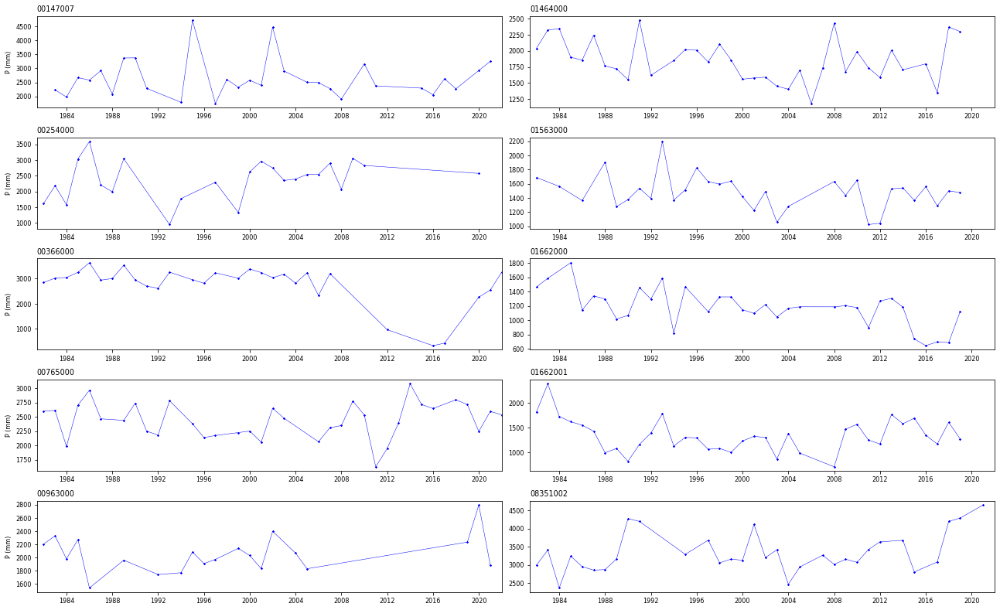

In [73]:
indexestoplot = stationscondition.index.tolist()[:]
plotfigs(numr = 5, numc = 2, datatoplot = annualdata4.loc[:, indexestoplot])

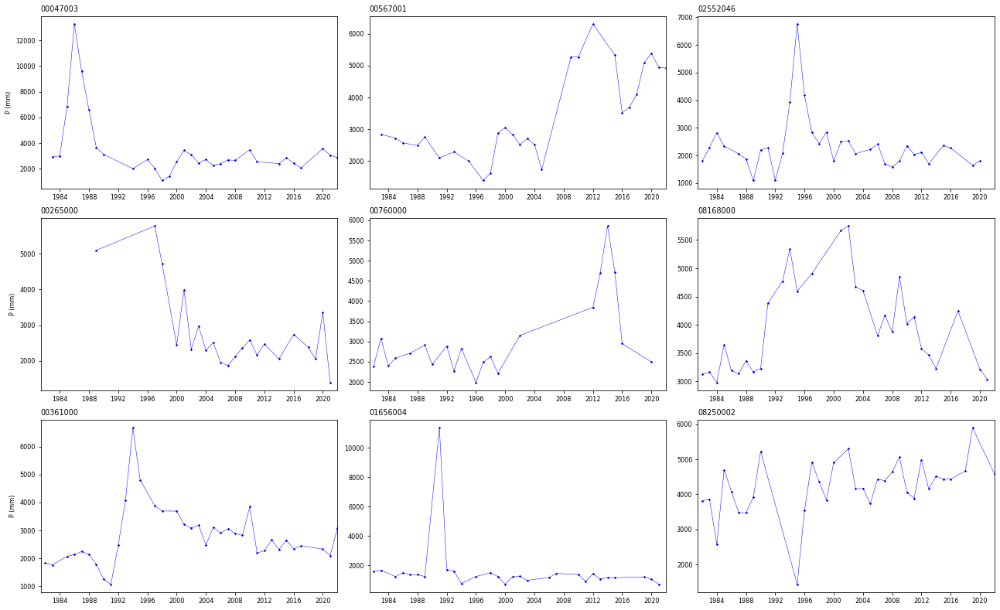

In [74]:
indexestoplot = stationsconditionann.index.tolist()[:]
plotfigs(numr = 3, numc = 3 , datatoplot = annualdata4.loc[:, indexestoplot])

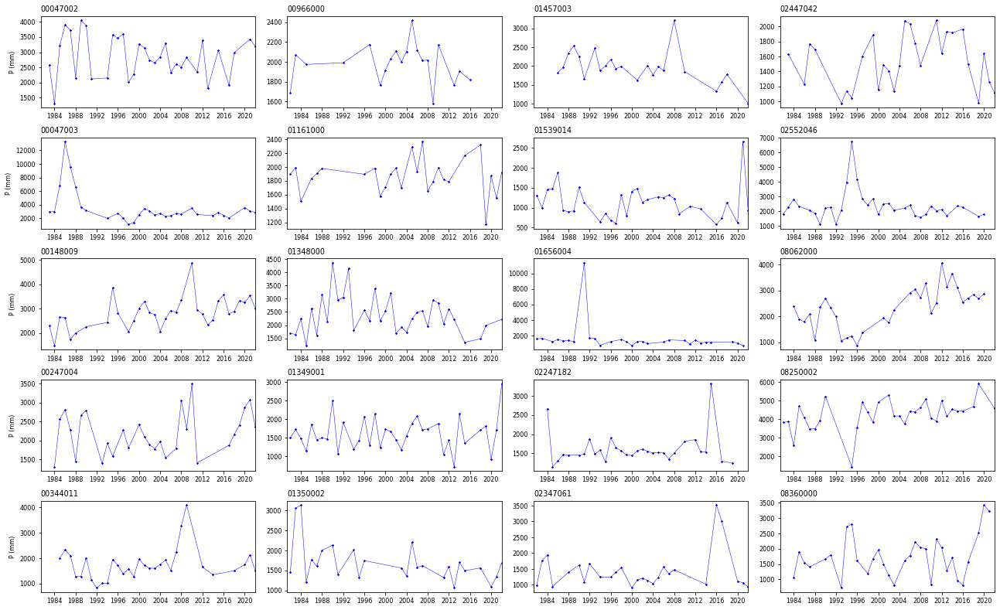

In [75]:
indexestoplot = stationsconditionmon.index.tolist()[:]
plotfigs(numr = 5, numc = 4 , datatoplot = annualdata4.loc[:, indexestoplot])

In [76]:
stationsconditionann

,Longitude,Latitude,State,City,Name
Code,,,,,
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00265000,-65.1167,-2.3500,AMAZONAS,MARAÃ,SÃO PEDRO
00361000,-61.3747,-3.8978,AMAZONAS,MANACAPURU,BERURI
00567001,-67.8569,-5.8936,AMAZONAS,CARAUARI,XIBAUA
00760000,-60.6436,-7.2050,AMAZONAS,NOVO ARIPUANÃ,PRAINHA VELHA
01656004,-56.6319,-16.9442,MATO GROSSO,POCONÉ,SÃO JOÃO
02552046,-52.9644,-25.3928,PARANÁ,QUEDAS DO IGUAÇU,LINHA MIRIM
08168000,-68.1536,1.3889,AMAZONAS,SÃO GABRIEL DA CACH,TUNUI
08250002,-50.9508,2.4956,AMAPÁ,CALÇOENE,CALÇOENE


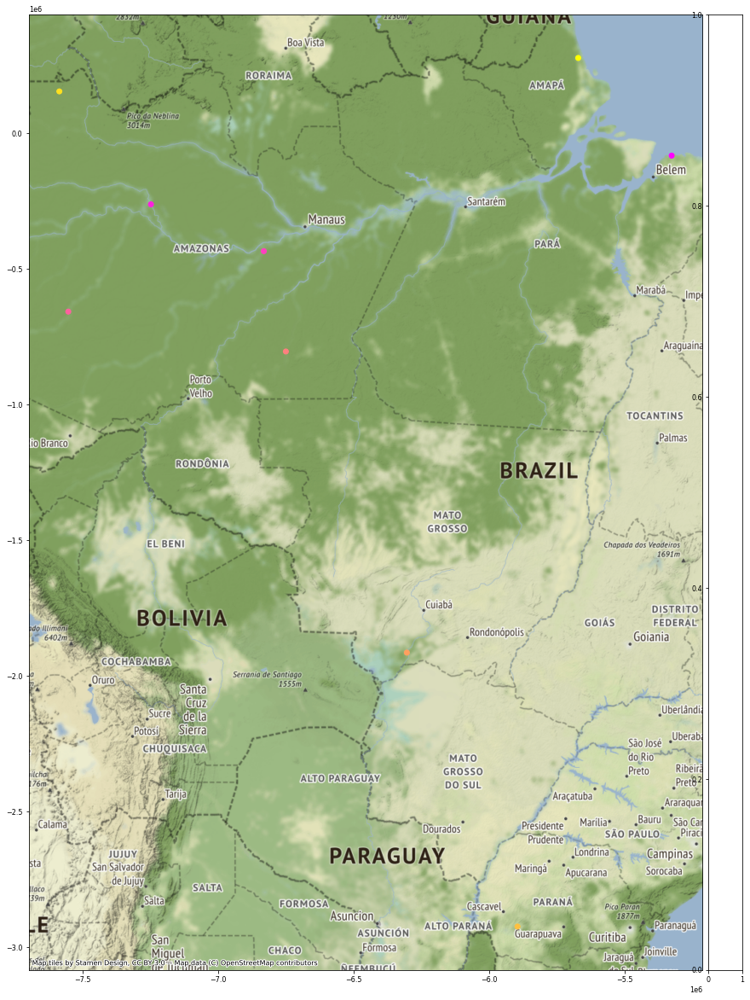

In [77]:
plot_conditions(stationsconditionann)

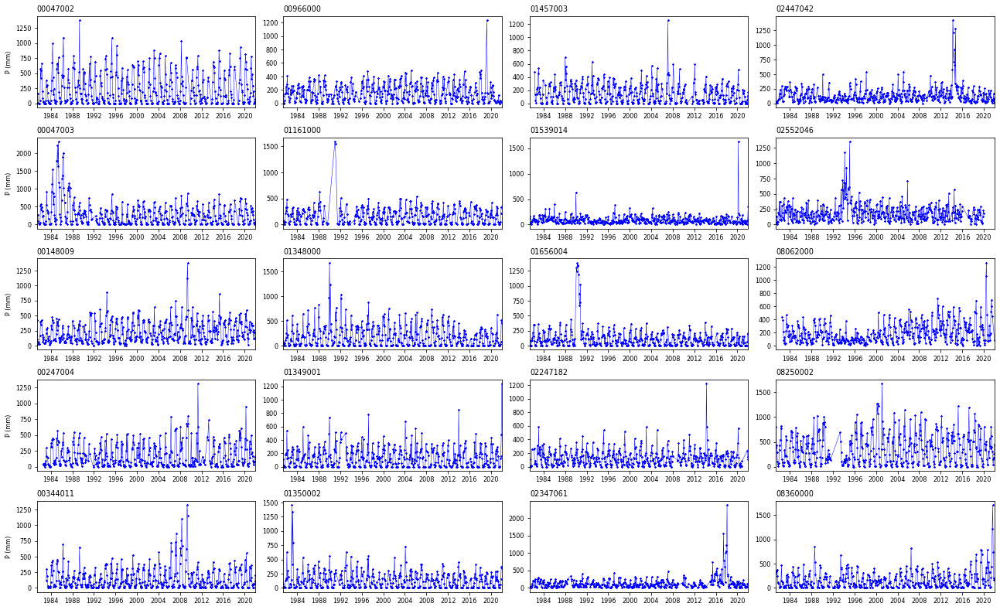

In [78]:
indexestoplot = stationsconditionmon.index.tolist()[:]
plotfigs(numr = 5, numc = 4 , datatoplot = monthdata3.loc[:, indexestoplot])

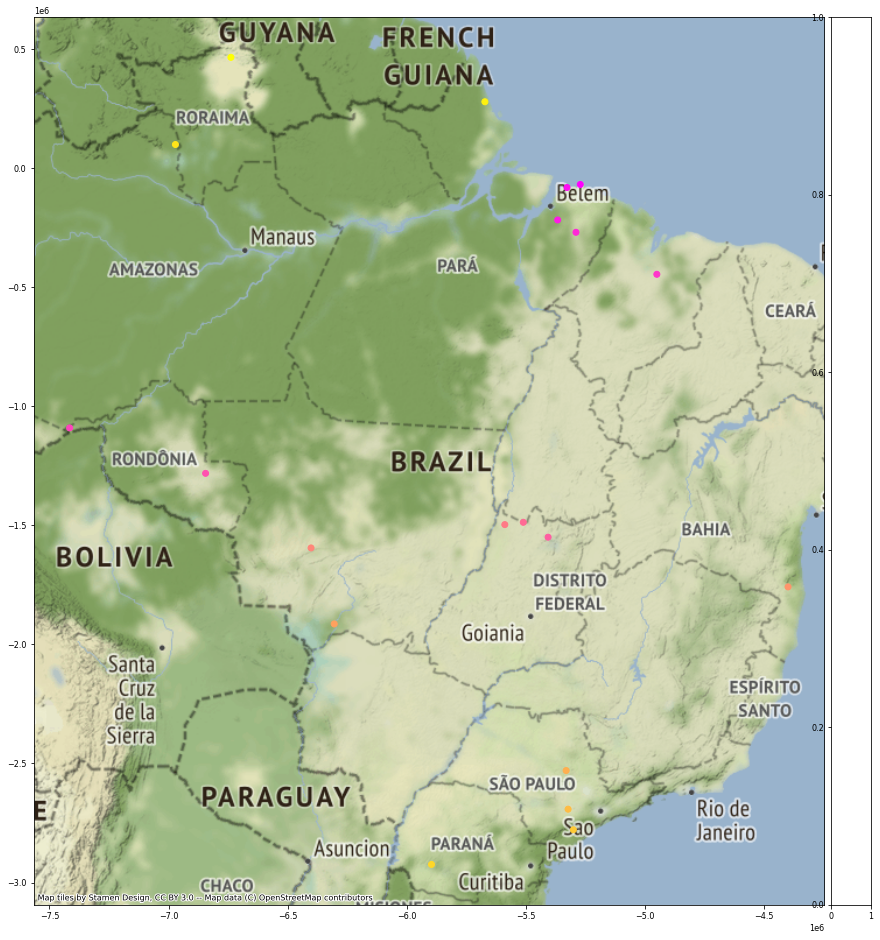

In [79]:
plot_conditions(stationsconditionmon)

Looking at this gauge we can see that the problem occurs in some daily data with about constant values. Clearly some errors.

<AxesSubplot:xlabel='dates'>

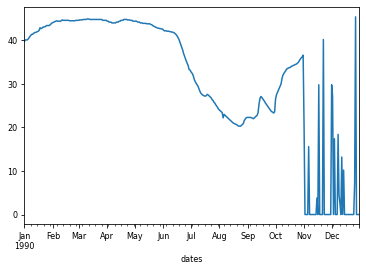

In [80]:
dailydata4.loc["1990":"1990", "01656004"].plot()

###########################################################################################################################

It seems that the problem in some of the gauges shown are related to small really low values in some years, therefore we should delete those values. In order to obtain a more automatized way for proceeding, we may select the years where we enconter problems, and delete the daily values of those years. For that we could use a simple function:

###############################################################################################################

#### Now we can do the same procedure made at the daily basis, but at this time in a monthly-basis:
Let's check now for the monthly maximums:

In [82]:
# Conditions daily:
idcondition = dailydata4.T[(dailydata4.T > 400).any(axis=1)].index.tolist()
stationscondition = stationsused.loc[idcondition]

# Conditions monthly:
idconditionmon = monthdata4.T[(monthdata4.T > 1200).any(axis=1)].index.tolist()
stationsconditionmon = stationsused.loc[idconditionmon]

# Conditions annual:
idconditionann = annualdata4.T[(annualdata4.T > 5500).any(axis=1)].index.tolist()
stationsconditionann = stationsused.loc[idconditionann]

print("The total number of gauges presenting 'outliers' is: Daily:", len(stationscondition), "Monthly:", len(stationsconditionmon), "Annual:", len(stationsconditionann)) 

The total number of gauges presenting 'outliers' is: Daily: 10 Monthly: 20 Annual: 9


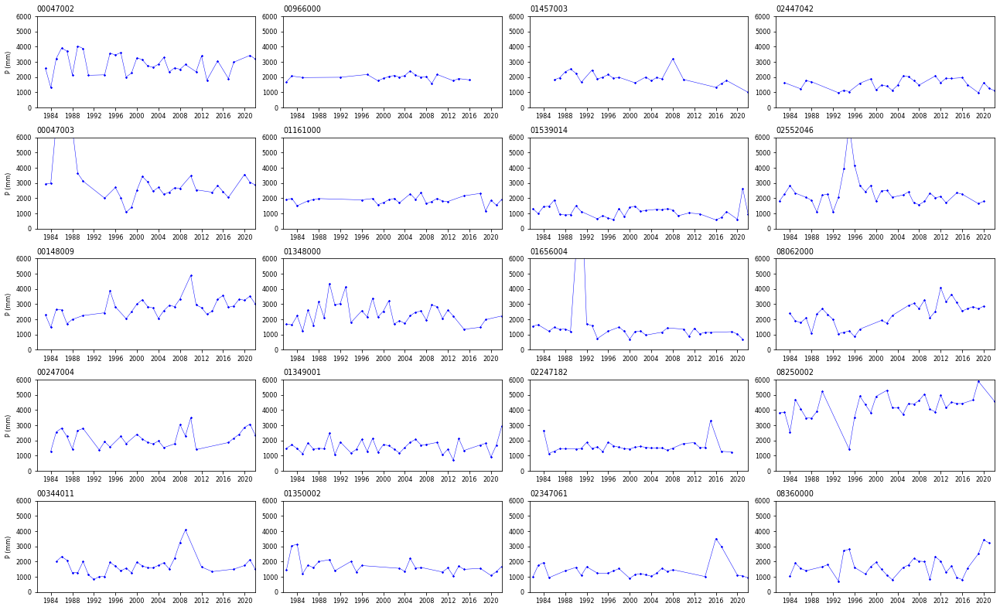

In [83]:
indexestoplot = stationsconditionmon.index.tolist()[:]
plotfigs(numr = 5, numc =  4, datatoplot = annualdata4.loc[:, indexestoplot], setylim = True, ymin = 0, ymax = 6000)

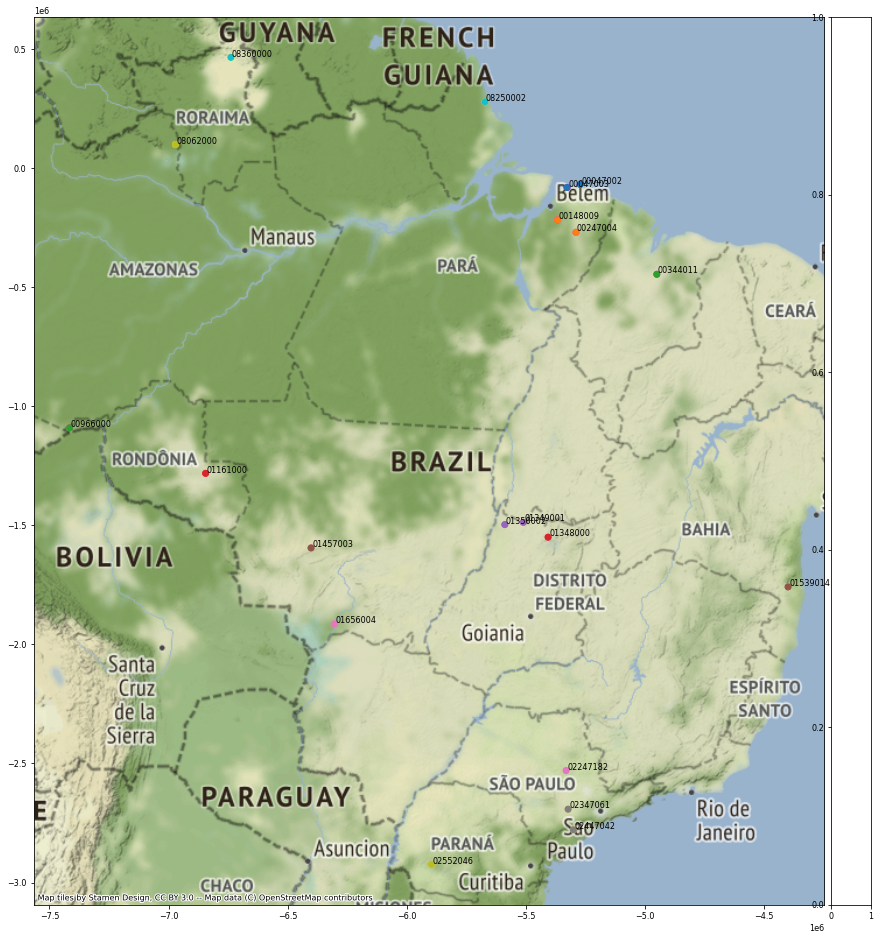

In [84]:
plot_conditions(stationsconditionmon, showcodes = True)

In [85]:
idconditionmon = monthdata4.T[(monthdata4.T > 1200).any(axis=1)].index.tolist()
stationsconditionmon = stationsused.loc[idconditionmon]
stationsconditionmon

,Longitude,Latitude,State,City,Name
Code,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00148009,-48.2064,-1.9611,PARÁ,ACARÁ,ACARÁ
00247004,-47.5161,-2.4261,PARÁ,IPIXUNA DO PARÁ,FAZENDA SÃO RAIMUNDO
00344011,-44.4661,-4.0078,MARANHÃO,SÃO MATEUS DO MARAN,SÃO MATEUS DO MARANHÃO
00966000,-66.6117,-9.7556,RONDÔNIA,PORTO VELHO,NOVA CALIFORNIA
01161000,-61.4839,-11.4408,RONDÔNIA,CACOAL,VISTA ALEGRE
01348000,-48.5669,-13.7900,GOIÁS,CAMPINAÇU,CAMPINAÇU
01349001,-49.5017,-13.2447,GOIÁS,NOVO PLANALTO,NOVO PLANALTO


<AxesSubplot:xlabel='dates'>

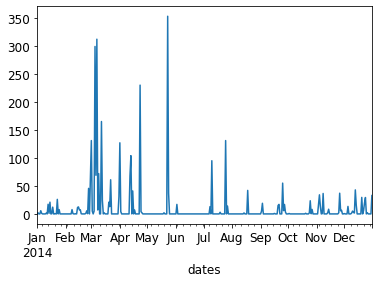

In [86]:
dailydata4.loc["2014":"2014", "02247182"].plot()

<AxesSubplot:xlabel='dates'>

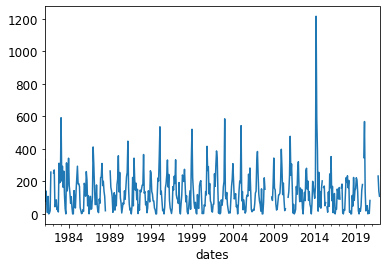

In [87]:
monthdata4.loc[:, "02247182"].plot()

Let's compute the monthly maximums, and then the monthly threshoulds. For this task we can use already a function:

In [88]:
fsummary4 = monthdata4.describe()
stationssummary4 = stationsused.copy()
stationssummary4["max"] = fsummary4.T["max"]
stationsdescribe4 = stationssummary4.groupby(by=["State"]).mean()
stationsdescribe4.drop(columns=['Longitude', 'Latitude'], inplace = True)
stationsdescribe4.rename(columns = {'max':'mean'}, inplace = True)
stationsdescribe4["min"] = stationssummary4.groupby(by=["State"]).min().iloc[:, 4]
stationsdescribe4["P25"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.25).iloc[:, 2]
stationsdescribe4["P50"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
stationsdescribe4["P75"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
stationsdescribe4["P90"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
stationsdescribe4["P95"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
stationsdescribe4["P99"] = stationssummary4.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
stationsdescribe4["max"] = stationssummary4.groupby(by=["State"]).max().iloc[:, 4]
stationsdescribe4

,mean,min,P25,P50,P75,P90,P95,P99,max
State,,,,,,,,,
ACRE,540.833333,506.8,509.725,513.30,577.550,601.35,602.725,603.8250,604.1
ALAGOAS,429.537500,250.8,340.500,414.20,537.025,584.05,591.225,596.9650,598.4
AMAPÁ,847.571429,512.2,577.350,745.10,925.850,1295.80,1482.550,1631.9500,1669.3
AMAZONAS,709.505455,480.8,597.950,686.80,781.600,899.80,973.760,1173.0540,1262.1
BAHIA,598.093750,340.6,488.400,566.70,678.725,789.45,844.100,987.4750,1633.0
BOLÍVIA,502.833333,373.6,389.150,447.80,550.325,681.65,737.675,782.4950,793.7
CEARÁ,563.907927,347.7,490.275,539.50,605.125,733.07,787.230,918.2850,976.0
DISTRITO FEDERAL,595.194118,439.8,526.000,565.20,635.600,714.02,806.420,964.2440,1003.7
ESPÍRITO SANTO,640.101351,440.0,543.375,630.20,712.075,788.34,844.920,917.9910,942.3


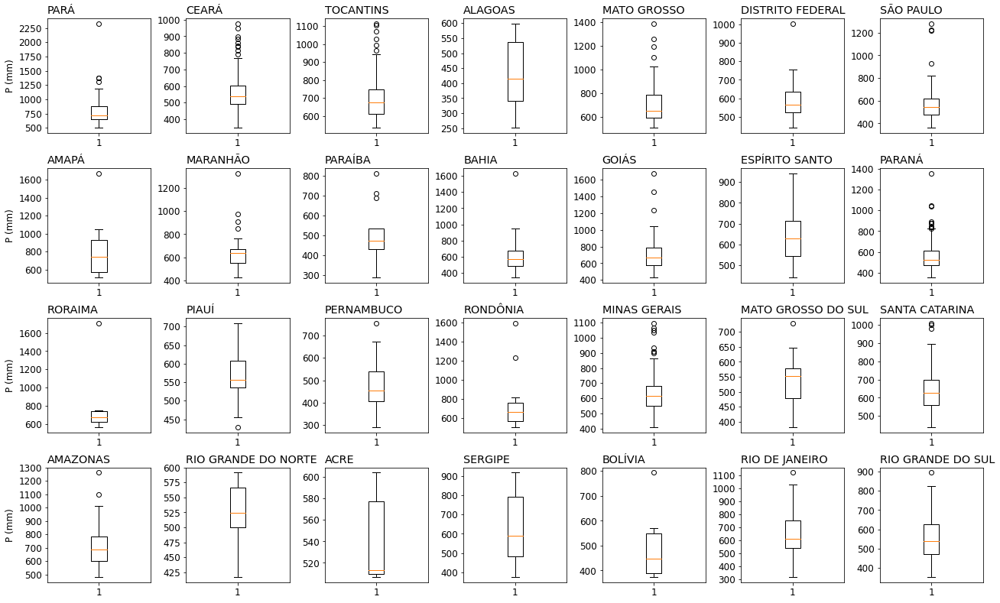

In [89]:
plotboxplots(4, 7, stationssummary4)

This function below is just the organization of the code used for the computation at the daily basis in the form of a function:

In [93]:
diffstationsdescribe5, diffpercstationsdescribe5, stationsdescribe5 = computethreshoulds(stationsdescribe4, maxdiffpercentage = 50.0, maxdiffinmm = 100.0)

In [94]:
diffpercstationsdescribe5

,P25,P50,P75,P90,P95,P99,max,maxdiff
State,,,,,,,,
ACRE,NaN,0.701359,12.517047,4.120855,0.228652,0.182504,0.045543,12.517047
ALAGOAS,NaN,21.644640,29.653549,8.756576,1.228491,0.970866,0.240383,29.653549
AMAPÁ,NaN,29.055166,24.258489,39.957877,14.411946,10.077232,2.288673,39.957877
AMAZONAS,NaN,14.859102,13.803145,15.122825,8.219604,20.466439,7.590955,20.466439
BAHIA,NaN,16.031941,19.767955,16.313676,6.922541,16.985547,65.371275,65.371275
BOLÍVIA,NaN,15.071309,22.895266,23.863172,8.219027,6.075846,1.431958,23.863172
CEARÁ,NaN,10.040284,12.164041,21.143565,7.388108,16.647613,6.285086,21.143565
DISTRITO FEDERAL,NaN,7.452471,12.455768,12.337948,12.940814,19.570943,4.091910,19.570943
ESPÍRITO SANTO,NaN,15.978836,12.991907,10.710248,7.177106,8.648274,2.648065,15.978836


In [95]:
diffstationsdescribe5

,P25,P50,P75,P90,P95,P99,max
State,,,,,,,
ACRE,NaN,3.575,64.250,23.800,1.375,1.1000,0.2750
ALAGOAS,NaN,73.700,122.825,47.025,7.175,5.7400,1.4350
AMAPÁ,NaN,167.750,180.750,369.950,186.750,149.4000,37.3500
AMAZONAS,NaN,88.850,94.800,118.200,73.960,199.2940,89.0460
BAHIA,NaN,78.300,112.025,110.725,54.650,143.3750,645.5250
BOLÍVIA,NaN,58.650,102.525,131.325,56.025,44.8200,11.2050
CEARÁ,NaN,49.225,65.625,127.945,54.160,131.0550,57.7150
DISTRITO FEDERAL,NaN,39.200,70.400,78.420,92.400,157.8240,39.4560
ESPÍRITO SANTO,NaN,86.825,81.875,76.265,56.580,73.0710,24.3090


In [116]:
stationsdescribe5

,mean,min,P25,P50,P75,P90,P95,P99,max,threshould
State,,,,,,,,,,
ACRE,540.833333,506.8,509.725,513.30,577.550,601.35,602.725,603.8250,604.1,604.1000
ALAGOAS,429.537500,250.8,340.500,414.20,537.025,584.05,591.225,596.9650,598.4,598.4000
AMAPÁ,847.571429,512.2,577.350,745.10,925.850,1295.80,1482.550,1631.9500,1669.3,1669.3000
AMAZONAS,709.505455,480.8,597.950,686.80,781.600,899.80,973.760,1173.0540,1262.1,1262.1000
BAHIA,598.093750,340.6,488.400,566.70,678.725,789.45,844.100,987.4750,1633.0,987.4750
BOLÍVIA,502.833333,373.6,389.150,447.80,550.325,681.65,737.675,782.4950,793.7,793.7000
CEARÁ,563.907927,347.7,490.275,539.50,605.125,733.07,787.230,918.2850,976.0,976.0000
DISTRITO FEDERAL,595.194118,439.8,526.000,565.20,635.600,714.02,806.420,964.2440,1003.7,1003.7000
ESPÍRITO SANTO,640.101351,440.0,543.375,630.20,712.075,788.34,844.920,917.9910,942.3,942.3000


Now we can end it seting some threshoulds based on the boxplot analysis for states where it seems that there is some issue with the automatic process:

In [117]:
stationsdescribe5.loc["GOIÁS", "threshould"] = 1200.0
stationsdescribe5.loc["PARANÁ", "threshould"] = 1200.0
stationsdescribe5.loc["SÃO PAULO", "threshould"] = 1200.0
stationsdescribe5.loc["RONDÔNIA", "threshould"] = 1200.0
stationsdescribe5.loc["MATO GROSSO", "threshould"] = 1100.0

stationsdescribe5

,mean,min,P25,P50,P75,P90,P95,P99,max,threshould
State,,,,,,,,,,
ACRE,540.833333,506.8,509.725,513.30,577.550,601.35,602.725,603.8250,604.1,604.1000
ALAGOAS,429.537500,250.8,340.500,414.20,537.025,584.05,591.225,596.9650,598.4,598.4000
AMAPÁ,847.571429,512.2,577.350,745.10,925.850,1295.80,1482.550,1631.9500,1669.3,1669.3000
AMAZONAS,709.505455,480.8,597.950,686.80,781.600,899.80,973.760,1173.0540,1262.1,1262.1000
BAHIA,598.093750,340.6,488.400,566.70,678.725,789.45,844.100,987.4750,1633.0,987.4750
BOLÍVIA,502.833333,373.6,389.150,447.80,550.325,681.65,737.675,782.4950,793.7,793.7000
CEARÁ,563.907927,347.7,490.275,539.50,605.125,733.07,787.230,918.2850,976.0,976.0000
DISTRITO FEDERAL,595.194118,439.8,526.000,565.20,635.600,714.02,806.420,964.2440,1003.7,1003.7000
ESPÍRITO SANTO,640.101351,440.0,543.375,630.20,712.075,788.34,844.920,917.9910,942.3,942.3000


#### Organizing the data that are above the threshould:

Now we can set to np.nan the daily values based on the monthly with those conditions.


In [132]:
dailydata6 = dailydata4.copy()
monthdata5 = monthdata4
stationssummary5 = stationssummary4

In [133]:
statesanalysed = stationsdescribe5.index
statesanalysed

Index(['ACRE', 'ALAGOAS', 'AMAPÁ', 'AMAZONAS', 'BAHIA', 'BOLÍVIA', 'CEARÁ',
       'DISTRITO FEDERAL', 'ESPÍRITO SANTO', 'GOIÁS', 'MARANHÃO',
       'MATO GROSSO', 'MATO GROSSO DO SUL', 'MINAS GERAIS', 'PARANÁ',
       'PARAÍBA', 'PARÁ', 'PERNAMBUCO', 'PIAUÍ', 'RIO DE JANEIRO',
       'RIO GRANDE DO NORTE', 'RIO GRANDE DO SUL', 'RONDÔNIA', 'RORAIMA',
       'SANTA CATARINA', 'SERGIPE', 'SÃO PAULO', 'TOCANTINS'],
      dtype='object', name='State')

In [134]:
for state in tqdm.tqdm(statesanalysed):
    
    stationthres = stationsdescribe5.loc[state, "threshould"]     
    stations = stationsused[stationsused["State"] == state].index.tolist()
    statinstate = stationssummary5[stationssummary5.State == state]
    statwithprob = statinstate[statinstate["max"] > stationthres]
    
    
    for station in statwithprob.index.tolist():
        years5 = monthdata5.loc[:, station][monthdata5.loc[:, station] > stationthres].index.year.tolist()
        months5 = monthdata5.loc[:, station][monthdata5.loc[:, station] > stationthres].index.month.tolist()
        i = 0
        for year5 in years5:
            
            if int(months5[i]) < 10:
                date5 = str(years5[i]) + "-0" + str(months5[i])
            else:
                date5 = str(years5[i]) + "-" + str(months5[i])
                
            dailydata6.loc[date5, station] = np.nan
            
            i = i + 1
            

100%|██████████████████████████████████████████████████| 28/28 [00:00<00:00, 337.41it/s]


Now we can check how is our data:

First we resample again:

In [101]:
monthdata6 = dailydata6.resample('M').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

In [102]:
annualdata6 = dailydata6.resample('Y').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

Now we analyse the summary of our monthly data again:

In [121]:
fsummary6 = monthdata6.describe()
stationssummary6 = stationsused.copy()
stationssummary6["max"] = fsummary6.T["max"]
stationsdescribe6 = stationssummary6.groupby(by=["State"]).mean()
stationsdescribe6.drop(columns=['Longitude', 'Latitude'], inplace = True)
stationsdescribe6.rename(columns = {'max':'mean'}, inplace = True)
stationsdescribe6["min"] = stationssummary6.groupby(by=["State"]).min().iloc[:, 4]
stationsdescribe6["P50"] = stationssummary6.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
stationsdescribe6["P75"] = stationssummary6.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
stationsdescribe6["P90"] = stationssummary6.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
stationsdescribe6["P95"] = stationssummary6.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
stationsdescribe6["P99"] = stationssummary6.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
stationsdescribe6["max"] = stationssummary6.groupby(by=["State"]).max().iloc[:, 4]
stationsdescribe6

,mean,min,P50,P75,P90,P95,P99,max
State,,,,,,,,
ACRE,540.833333,506.8,513.30,577.550,601.35,602.725,603.8250,604.1
ALAGOAS,429.537500,250.8,414.20,537.025,584.05,591.225,596.9650,598.4
AMAPÁ,847.571429,512.2,745.10,925.850,1295.80,1482.550,1631.9500,1669.3
AMAZONAS,709.505455,480.8,686.80,781.600,899.80,973.760,1173.0540,1262.1
BAHIA,587.711458,340.6,566.70,672.600,770.30,838.375,925.0000,953.5
BOLÍVIA,502.833333,373.6,447.80,550.325,681.65,737.675,782.4950,793.7
CEARÁ,563.907927,347.7,539.50,605.125,733.07,787.230,918.2850,976.0
DISTRITO FEDERAL,595.194118,439.8,565.20,635.600,714.02,806.420,964.2440,1003.7
ESPÍRITO SANTO,640.101351,440.0,630.20,712.075,788.34,844.920,917.9910,942.3


We can also check again the conditions, but just to be sure:

In [122]:
# Conditions daily:
idcondition = dailydata6.T[(dailydata6.T > 400).any(axis=1)].index.tolist()
stationscondition = stationsused.loc[idcondition]

# Conditions monthly:
idconditionmon = monthdata6.T[(monthdata6.T > 1200).any(axis=1)].index.tolist()
stationsconditionmon = stationsused.loc[idconditionmon]

# Conditions annual:
idconditionann = annualdata6.T[(annualdata6.T > 5500).any(axis=1)].index.tolist()
stationsconditionann = stationsused.loc[idconditionann]

print("The total number of gauges presenting 'outliers' is: Daily:", len(stationscondition), "Monthly:", len(stationsconditionmon), "Annual:", len(stationsconditionann)) 

The total number of gauges presenting 'outliers' is: Daily: 10 Monthly: 6 Annual: 8


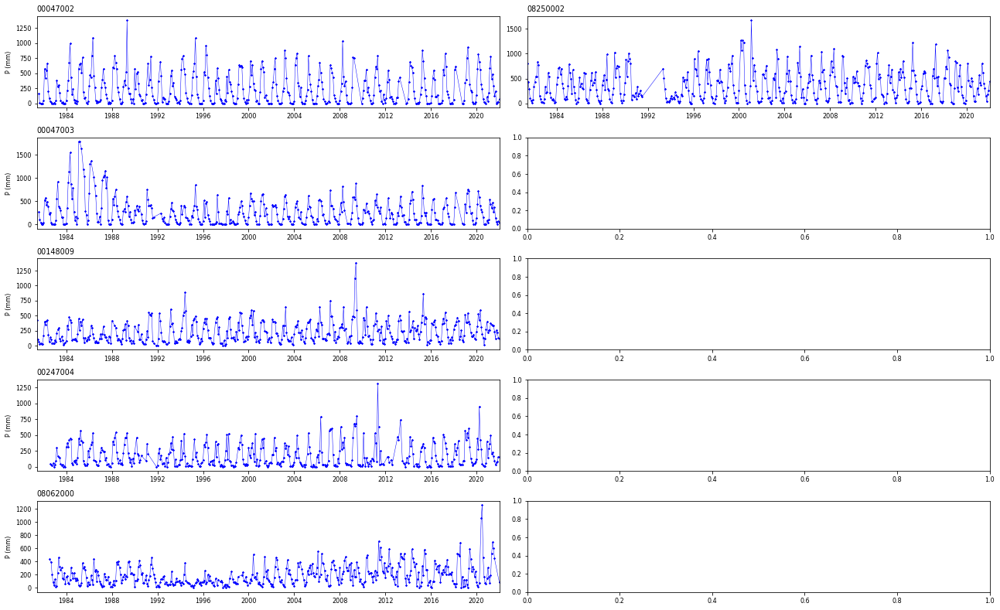

In [123]:
indexestoplot = stationsconditionmon.index.tolist()[:]
plotfigs(numr = 5, numc = 2 , datatoplot = monthdata6.loc[:, indexestoplot])

In [124]:
stationsconditionmon

,Longitude,Latitude,State,City,Name
Code,,,,,
00047002,-47.3536,-0.6231,PARÁ,SALINÓPOLIS,SALINÓPOLIS
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00148009,-48.2064,-1.9611,PARÁ,ACARÁ,ACARÁ
00247004,-47.5161,-2.4261,PARÁ,IPIXUNA DO PARÁ,FAZENDA SÃO RAIMUNDO
08062000,-62.6222,0.8842,AMAZONAS,BARCELOS,POSTO AJURICABA
08250002,-50.9508,2.4956,AMAPÁ,CALÇOENE,CALÇOENE


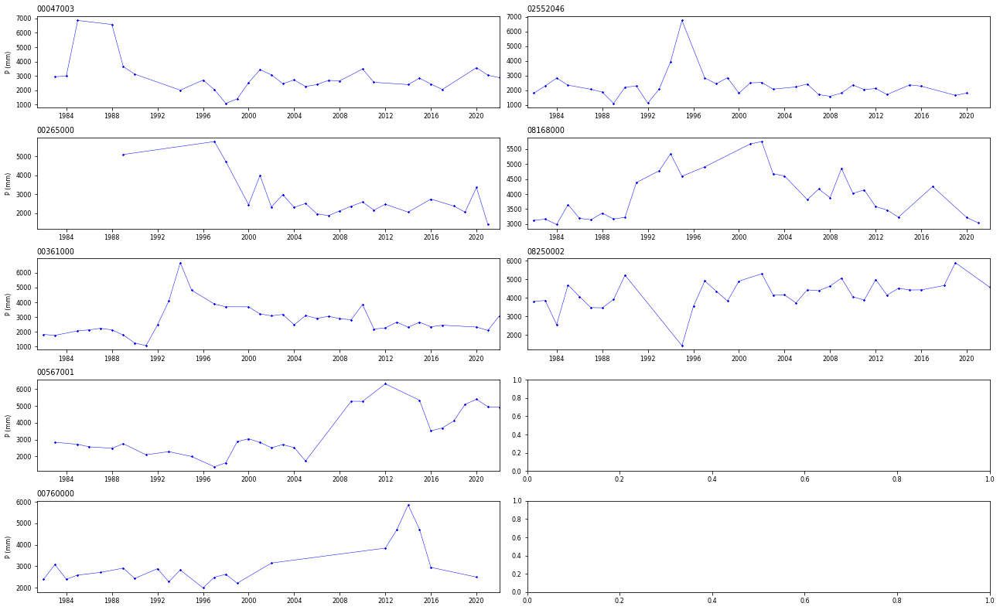

In [125]:
indexestoplot = stationsconditionann.index.tolist()[:]
plotfigs(numr = 5, numc = 2 , datatoplot = annualdata6.loc[:, indexestoplot])

In [126]:
stationsconditionann

,Longitude,Latitude,State,City,Name
Code,,,,,
00047003,-47.8536,-0.7375,PARÁ,CURUÇA,CURUÇA
00265000,-65.1167,-2.3500,AMAZONAS,MARAÃ,SÃO PEDRO
00361000,-61.3747,-3.8978,AMAZONAS,MANACAPURU,BERURI
00567001,-67.8569,-5.8936,AMAZONAS,CARAUARI,XIBAUA
00760000,-60.6436,-7.2050,AMAZONAS,NOVO ARIPUANÃ,PRAINHA VELHA
02552046,-52.9644,-25.3928,PARANÁ,QUEDAS DO IGUAÇU,LINHA MIRIM
08168000,-68.1536,1.3889,AMAZONAS,SÃO GABRIEL DA CACH,TUNUI
08250002,-50.9508,2.4956,AMAPÁ,CALÇOENE,CALÇOENE


<AxesSubplot:xlabel='dates'>

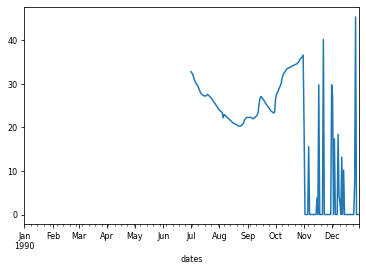

In [137]:
dailydata6.loc["1990":"1990", "01656004"].plot()

#### We can save, so we do not need to run those time-consuming parts again:

In [135]:
#dailydata6.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\dailydata6.csv')  
#monthdata6.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata6.csv')  
#annualdata6.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata6.csv')  
#stationsused.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\stationsused.csv')  

#### Now we can just reload it:

In [136]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\dailydata6.csv'
dailydata6 = pd.read_csv(path, index_col = [0])
dailydata6.index = pd.to_datetime(dailydata6.index)
dailydata6.head()

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
dates,,,,,,,,,,,,,,,,,,,,,
1981-01-01,12.1,NaN,NaN,NaN,0.5,0.0,0.0,NaN,0.0,0.0,...,11.2,17.6,0.0,14.9,NaN,0.0,0.0,0.0,0.0,0.0
1981-01-02,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,0.0,...,0.0,22.0,0.0,0.3,NaN,0.0,0.0,0.0,0.0,0.0
1981-01-03,NaN,NaN,NaN,NaN,0.2,0.0,0.0,NaN,0.0,0.0,...,0.0,38.2,0.0,7.2,NaN,0.0,0.0,0.0,0.0,0.0
1981-01-04,NaN,NaN,NaN,NaN,3.3,0.0,0.0,NaN,0.0,0.0,...,0.0,22.4,0.0,28.2,NaN,0.0,0.0,0.0,0.0,0.0
1981-01-05,NaN,NaN,NaN,NaN,25.0,8.3,2.2,NaN,0.0,0.0,...,0.0,0.0,0.0,12.6,NaN,0.2,0.0,0.0,7.2,0.0


In [138]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata6.csv'
monthdata6 = pd.read_csv(path, index_col = [0])
monthdata6.index = pd.to_datetime(monthdata6.index)
monthdata6.head()

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
dates,,,,,,,,,,,,,,,,,,,,,
1981-01-31,NaN,NaN,NaN,NaN,415.1,64.4,50.8,NaN,28.8,227.2,...,189.8,522.4,6.7,266.8,NaN,1.8,0.0,3.0,21.4,0.0
1981-02-28,NaN,NaN,NaN,NaN,236.1,151.2,200.2,NaN,106.8,238.6,...,217.3,625.8,58.1,575.8,NaN,NaN,11.6,24.6,21.4,NaN
1981-03-31,NaN,NaN,NaN,NaN,84.3,130.7,129.9,NaN,158.6,187.8,...,274.0,170.3,44.3,222.0,NaN,4.8,0.0,74.9,21.9,80.0
1981-04-30,NaN,NaN,NaN,NaN,158.7,274.1,389.2,NaN,123.9,151.0,...,228.6,390.3,302.9,343.8,NaN,286.0,231.8,84.7,298.9,438.0
1981-05-31,NaN,NaN,NaN,NaN,362.8,296.3,198.0,NaN,175.2,506.9,...,413.2,804.1,437.8,444.1,NaN,323.6,371.0,66.0,NaN,693.0


In [139]:
path =r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata6.csv'
annualdata6 = pd.read_csv(path, index_col = [0])
annualdata6.index = pd.to_datetime(annualdata6.index)
annualdata6.head()

,00047002,00047003,00047004,00048006,00051002,00061000,00063000,00065001,00066000,00146005,...,08168000,08250002,08261000,08351002,08359000,08360000,08360002,08361000,08361001,08361004
dates,,,,,,,,,,,,,,,,,,,,,
1981-12-31,NaN,NaN,NaN,NaN,1941.5,1784.5,1894.4,NaN,1450.7,NaN,...,3123.0,3814.9,2304.2,2990.9,NaN,NaN,NaN,448.8,NaN,NaN
1982-12-31,2578.7,2944.2,NaN,NaN,2564.7,2465.9,1963.4,NaN,1760.0,NaN,...,3164.7,3860.2,1962.2,3412.2,NaN,NaN,NaN,1700.3,1536.3,1580.8
1983-12-31,1315.6,2989.0,1296.7,1597.0,2027.4,2378.3,2034.9,2012.6,NaN,1608.7,...,2984.2,2569.6,1848.3,2370.2,NaN,1058.6,936.1,NaN,NaN,822.1
1984-12-31,3216.3,6861.0,2938.2,2899.4,2414.7,2246.8,2367.4,2957.0,1796.1,2568.2,...,3650.3,4697.5,1954.7,3243.1,NaN,1897.0,NaN,NaN,1872.3,1110.2
1985-12-31,3902.5,NaN,4224.8,3836.4,2777.6,1783.6,1811.7,2540.7,1913.9,3046.1,...,3190.6,4074.7,1635.2,2954.5,1611.4,1547.5,1112.1,1997.6,1617.2,NaN


#### Now we can analyse some data:


<AxesSubplot:xlabel='dates'>

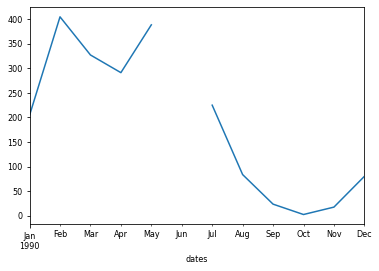

In [158]:
monthdata6.loc["1990":"1990", "01656004"].plot()

<AxesSubplot:xlabel='dates'>

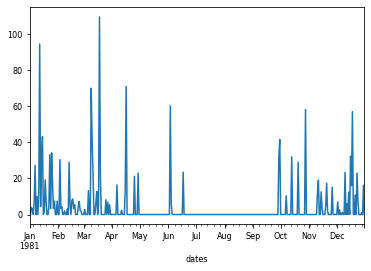

In [188]:
dailydata6.loc["1981":"1981", "01656004"].plot()

In [208]:
descpermonth = pd.DataFrame(index = stationsdescribe5.index)

for monthcount in range(1,13):
    nov_mask = monthdata6.index.map(lambda x: x.month) == monthcount
    aux = monthdata6[nov_mask]
    
    
    fsummary = aux.describe()
    stationssummary = stationsused.copy()
    stationssummary["max"] = fsummary.T["max"]
    

    stationsdescribe = stationssummary.groupby(by=["State"]).mean()
    
    
    descpermonth["max"+str(monthcount)] =  stationsdescribe.iloc[:, -1]
    
    
descpermonth

In [210]:
descpermonth

,max1,max2,max3,max4,max5,max6,max7,max8,max9,max10,max11,max12
State,,,,,,,,,,,,
ACRE,511.266667,494.816667,446.133333,371.266667,269.866667,145.883333,122.950000,176.083333,245.083333,289.000000,410.550000,430.550000
ALAGOAS,279.975000,179.387500,257.500000,289.450000,370.100000,309.800000,279.375000,184.000000,134.725000,152.150000,131.687500,142.800000
AMAPÁ,715.771429,651.185714,735.585714,706.457143,681.028571,504.171429,329.414286,218.885714,116.757143,150.928571,253.842857,573.328571
AMAZONAS,582.965636,560.218182,595.152727,556.539636,530.006000,420.149091,322.467636,286.565455,311.674545,395.681091,451.533818,535.510909
BAHIA,456.229167,306.116875,402.570833,259.703854,186.323958,144.501042,134.203448,105.979167,128.010417,226.802812,336.526771,508.066667
BOLÍVIA,438.733333,458.316667,370.183333,265.266667,268.150000,172.066667,119.800000,120.200000,231.350000,223.333333,318.133333,455.900000
CEARÁ,430.211585,399.769512,492.956707,518.373171,304.155488,185.832927,110.981098,56.087195,39.829268,65.405488,79.606707,194.254268
DISTRITO FEDERAL,480.717647,460.776471,435.011765,280.270588,113.929412,46.629412,70.964706,82.658824,140.094118,415.652941,440.864706,508.323529
ESPÍRITO SANTO,514.505405,332.304054,417.190541,240.720270,176.560811,147.312162,135.743243,169.152703,196.474324,335.709054,481.337838,583.478378


At this point we have a time-series that we may assume as without major problems in the measurements despite the gaps.

#### Now we can analyse our data, and check some statistics at State's level:

(a) Percentage of failures:

In [241]:
fsummarymonaux7 = monthdata6.describe()
fsummarydayaux7 = dailydata6.describe()

#### At monthly basis:

In [242]:
fsummarymon7 = stationsused.copy()
fsummarymon7["perfails"] = (1 - fsummarymonaux7.T["count"]/len(monthdata6))*100
fsummarymonstates7 = fsummarymon7.groupby(by=["State"]).mean()

fsummarymonstates7.drop(columns=['Longitude', 'Latitude'], inplace = True)
fsummarymonstates7.rename(columns = {'perfails':'mean'}, inplace = True)
fsummarymonstates7["min"] = fsummarymon7.groupby(by=["State"]).min().iloc[:, 4]
fsummarymonstates7["P50"] = fsummarymon7.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
fsummarymonstates7["P75"] = fsummarymon7.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
fsummarymonstates7["P90"] = fsummarymon7.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
fsummarymonstates7["P95"] = fsummarymon7.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
fsummarymonstates7["P99"] = fsummarymon7.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
fsummarymonstates7["max"] = fsummarymon7.groupby(by=["State"]).max().iloc[:, 4]
fsummarymonstates7

,mean,min,P50,P75,P90,P95,P99,max
State,,,,,,,,
ACRE,10.2,8.5,10.0,11.3,11.8,11.9,12.0,12.0
ALAGOAS,1.5,0.2,1.3,2.0,2.7,3.1,3.4,3.5
AMAPÁ,8.3,3.7,6.5,10.3,13.4,15.2,16.7,17.1
AMAZONAS,7.3,0.6,6.5,9.8,13.9,15.3,17.3,18.5
BAHIA,5.4,0.4,3.7,8.2,11.7,13.0,16.3,20.7
BOLÍVIA,7.9,5.3,8.5,9.2,9.7,9.8,9.9,10.0
CEARÁ,1.5,0.0,0.8,1.8,4.4,6.0,8.6,9.3
DISTRITO FEDERAL,6.5,0.2,5.1,11.6,16.4,16.9,17.7,17.9
ESPÍRITO SANTO,3.7,0.0,2.4,5.7,8.1,9.2,13.3,17.3


#### At the daily basis:

In [243]:
fsummaryday7 = stationsused.copy()
fsummaryday7["perfails"] = (1 - fsummarydayaux7.T["count"]/len(dailydata6))*100
fsummarydaystates7 = fsummaryday7.groupby(by=["State"]).mean()

fsummarydaystates7.drop(columns=['Longitude', 'Latitude'], inplace = True)
fsummarydaystates7.rename(columns = {'perfails':'mean'}, inplace = True)
fsummarydaystates7["min"] = fsummaryday7.groupby(by=["State"]).min().iloc[:, 4]
fsummarydaystates7["P50"] = fsummaryday7.groupby(by=["State"]).quantile(q = 0.5).iloc[:, 2]
fsummarydaystates7["P75"] = fsummaryday7.groupby(by=["State"]).quantile(q = 0.75).iloc[:, 2]
fsummarydaystates7["P90"] = fsummaryday7.groupby(by=["State"]).quantile(q = 0.90).iloc[:, 2]
fsummarydaystates7["P95"] = fsummaryday7.groupby(by=["State"]).quantile(q = 0.95).iloc[:, 2]
fsummarydaystates7["P99"] = fsummaryday7.groupby(by=["State"]).quantile(q = 0.99).iloc[:, 2]
fsummarydaystates7["max"] = fsummaryday7.groupby(by=["State"]).max().iloc[:, 4]
fsummarydaystates7

,mean,min,P50,P75,P90,P95,P99,max
State,,,,,,,,
ACRE,8.1,6.9,8.4,8.6,9.0,9.2,9.3,9.3
ALAGOAS,0.8,0.2,0.7,1.2,1.6,1.6,1.6,1.6
AMAPÁ,4.9,0.7,5.5,6.8,8.3,8.7,9.0,9.1
AMAZONAS,4.7,0.3,5.0,6.8,8.4,8.6,9.1,9.3
BAHIA,3.0,0.0,1.9,4.2,7.5,9.6,9.7,9.8
BOLÍVIA,7.9,5.3,8.4,9.1,9.6,9.7,9.9,9.9
CEARÁ,1.3,0.0,0.4,1.5,3.8,6.0,8.3,9.2
DISTRITO FEDERAL,2.5,0.0,1.5,3.5,6.4,7.0,7.3,7.3
ESPÍRITO SANTO,2.2,0.0,1.4,3.6,5.5,7.1,8.3,8.8


Now we can organize our data excluding the special characteres from the names: 

In [244]:
statesold = fsummarydaystates7.index.tolist()
statesnew = list(map(lambda x: x.replace('Á', 'A'), statesold))
statesnew = list(map(lambda x: x.replace('Í', 'I'), statesnew))
statesnew = list(map(lambda x: x.replace('Ô', 'O'), statesnew))
statesnew = list(map(lambda x: x.replace('Ã', 'A'), statesnew))

statesnew

['ACRE',
 'ALAGOAS',
 'AMAPA',
 'AMAZONAS',
 'BAHIA',
 'BOLIVIA',
 'CEARA',
 'DISTRITO FEDERAL',
 'ESPIRITO SANTO',
 'GOIAS',
 'MARANHAO',
 'MATO GROSSO',
 'MATO GROSSO DO SUL',
 'MINAS GERAIS',
 'PARANA',
 'PARAIBA',
 'PARA',
 'PERNAMBUCO',
 'PIAUI',
 'RIO DE JANEIRO',
 'RIO GRANDE DO NORTE',
 'RIO GRANDE DO SUL',
 'RONDONIA',
 'RORAIMA',
 'SANTA CATARINA',
 'SERGIPE',
 'SAO PAULO',
 'TOCANTINS']

Here we can check the maximum and minimum percentage of failures, and additionally the number of gauges per state:

In [245]:
fsummarymonstatesinfos = pd.DataFrame(data = fsummarymonstates7.iloc[:, [0, 1, -1]])
fsummarymonstatesinfos["num_gauges"] = fsummarymon7.groupby(by=["State"]).count().iloc[:, 0]
fsummarymonstatesinfos["State"] = statesnew
fsummarymonstatesinfos.set_index("State", inplace = True)
fsummarymonstatesinfos

,mean,min,max,num_gauges
State,,,,
ACRE,10.2,8.5,12.0,6
ALAGOAS,1.5,0.2,3.5,8
AMAPA,8.3,3.7,17.1,7
AMAZONAS,7.3,0.6,18.5,55
BAHIA,5.4,0.4,20.7,96
BOLIVIA,7.9,5.3,10.0,6
CEARA,1.5,0.0,9.3,164
DISTRITO FEDERAL,6.5,0.2,17.9,17
ESPIRITO SANTO,3.7,0.0,17.3,74


At this point we can have a look at our data considering the area covered by gauges in each state (gauge's density). It is important to keep in mind the suggested number of below 1 gauge per 500 km² suggested by WMO.

In [246]:
fp = r"C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\shp/states.shp"
states = gpd.read_file(fp)
states.set_index("NM_ESTADO", inplace = True)

In [247]:
fsummarymonstatesinfos["Areakm2"] = states["Area"]
fsummarymonstatesinfos

,mean,min,max,num_gauges,Areakm2
State,,,,,
ACRE,10.2,8.5,12.0,6,"164,124.0"
ALAGOAS,1.5,0.2,3.5,8,"27,848.1"
AMAPA,8.3,3.7,17.1,7,"142,828.7"
AMAZONAS,7.3,0.6,18.5,55,"1,559,148.0"
BAHIA,5.4,0.4,20.7,96,"564,732.5"
BOLIVIA,7.9,5.3,10.0,6,NaN
CEARA,1.5,0.0,9.3,164,"148,887.6"
DISTRITO FEDERAL,6.5,0.2,17.9,17,"5,780.0"
ESPIRITO SANTO,3.7,0.0,17.3,74,"46,086.9"


In [248]:
fsummarymonstatesinfos["gaugeskm2"] = (fsummarymonstatesinfos["Areakm2"]/fsummarymonstatesinfos["num_gauges"])
fsummarymonstatesinfos

,mean,min,max,num_gauges,Areakm2,gaugeskm2
State,,,,,,
ACRE,10.2,8.5,12.0,6,"164,124.0","27,354.0"
ALAGOAS,1.5,0.2,3.5,8,"27,848.1","3,481.0"
AMAPA,8.3,3.7,17.1,7,"142,828.7","20,404.1"
AMAZONAS,7.3,0.6,18.5,55,"1,559,148.0","28,348.1"
BAHIA,5.4,0.4,20.7,96,"564,732.5","5,882.6"
BOLIVIA,7.9,5.3,10.0,6,NaN,NaN
CEARA,1.5,0.0,9.3,164,"148,887.6",907.9
DISTRITO FEDERAL,6.5,0.2,17.9,17,"5,780.0",340.0
ESPIRITO SANTO,3.7,0.0,17.3,74,"46,086.9",622.8


#####################################################################################################

We do have a problem with those two gauges at the daily basis: 00734008 (Paraíba) and 01656004 (Mato Grosso). Thus, let's check it further and correct what we can:

<AxesSubplot:xlabel='dates'>

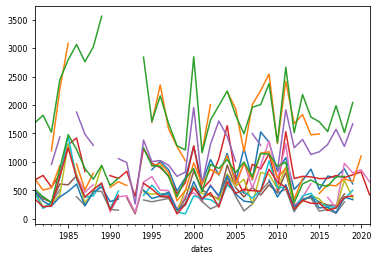

In [269]:
indices = stationsused[stationsused.State == "PARAÍBA"].index.tolist()
annualdata6.loc[:, indices].plot(legend = False)

<AxesSubplot:xlabel='dates'>

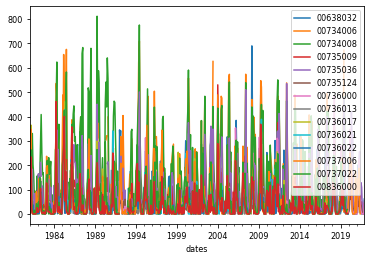

In [251]:
monthdata6.loc[:, indices].plot()

Let's check the annual data in Paraiba of those two gauges which are located nearby:

In [252]:
annualdata6.loc[:, ["00734008","00734006"]]

,00734008,00734006
dates,,
1981-12-31,"1,683.7",NaN
1982-12-31,"1,818.4",NaN
1983-12-31,"1,520.2","1,193.7"
1984-12-31,"2,441.9","2,277.6"
1985-12-31,"2,794.9","3,085.6"
1986-12-31,"3,064.9",NaN
1987-12-31,"2,759.6",NaN
1988-12-31,"3,020.5",NaN
1989-12-31,"3,560.9",NaN


It seems that there is an issue with the gauge 00734008 in 1989

In [253]:
annualdata6.loc[:, indices]

,00638032,00734006,00734008,00735009,00735036,00735124,00736000,00736013,00736017,00736021,00736022,00737006,00737022,00836000
dates,,,,,,,,,,,,,,
1981-12-31,NaN,NaN,"1,683.7",678.7,"1,033.3",478.5,NaN,386.0,478.9,446.7,480.3,698.5,519.8,346.4
1982-12-31,NaN,NaN,"1,818.4",759.6,NaN,349.5,NaN,384.4,207.4,179.0,306.0,502.0,379.9,205.9
1983-12-31,NaN,"1,193.7","1,520.2",555.3,954.0,284.6,NaN,283.2,259.0,288.5,221.7,539.2,280.2,221.7
1984-12-31,NaN,"2,277.6","2,441.9",777.9,"1,436.4",607.9,NaN,505.2,417.6,708.9,379.9,932.6,879.5,742.6
1985-12-31,NaN,"3,085.6","2,794.9","1,298.5",NaN,594.4,NaN,NaN,"1,312.8","1,458.7",478.5,NaN,"1,477.5","1,244.9"
1986-12-31,NaN,NaN,"3,064.9","1,419.2","1,874.2",754.8,759.5,384.2,776.4,686.3,606.4,961.0,"1,217.2",724.0
1987-12-31,710.3,NaN,"2,759.6",827.5,"1,485.0",NaN,462.8,232.4,279.8,377.6,223.6,503.4,883.1,380.2
1988-12-31,NaN,NaN,"3,020.5",NaN,"1,288.9",605.4,597.1,480.7,456.4,400.3,467.6,799.4,693.2,510.9
1989-12-31,NaN,NaN,"3,560.9",NaN,NaN,NaN,NaN,477.9,921.0,620.9,556.1,NaN,937.0,624.8


In [254]:
annualdata6.loc[:, indices].corr()

,00638032,00734006,00734008,00735009,00735036,00735124,00736000,00736013,00736017,00736021,00736022,00737006,00737022,00836000
00638032,1.0,0.6,0.4,0.5,0.4,0.6,0.7,0.6,0.8,0.6,0.8,0.9,0.8,0.7
00734006,0.6,1.0,0.9,0.8,0.8,0.6,0.6,0.6,0.6,0.8,0.6,0.7,0.7,0.7
00734008,0.4,0.9,1.0,0.8,0.7,0.7,0.3,0.5,0.5,0.5,0.5,0.5,0.6,0.6
00735009,0.5,0.8,0.8,1.0,0.7,0.8,0.4,0.6,0.6,0.5,0.7,0.6,0.6,0.6
00735036,0.4,0.8,0.7,0.7,1.0,0.6,0.4,0.3,0.3,0.3,0.4,0.4,0.5,0.3
00735124,0.6,0.6,0.7,0.8,0.6,1.0,0.6,0.8,0.6,0.6,0.8,0.7,0.6,0.7
00736000,0.7,0.6,0.3,0.4,0.4,0.6,1.0,0.6,0.8,0.8,0.6,0.7,0.7,0.7
00736013,0.6,0.6,0.5,0.6,0.3,0.8,0.6,1.0,0.7,0.7,0.8,0.7,0.5,0.7
00736017,0.8,0.6,0.5,0.6,0.3,0.6,0.8,0.7,1.0,0.8,0.7,0.8,0.8,0.8
00736021,0.6,0.8,0.5,0.5,0.3,0.6,0.8,0.7,0.8,1.0,0.6,0.8,0.7,0.9


<AxesSubplot:xlabel='dates'>

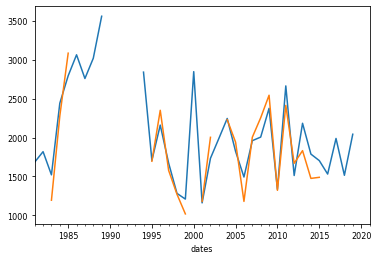

In [255]:
annualdata6.loc[:, ["00734008","00734006"]].plot(legend = False)

In [256]:
annualdata6.loc[:, ["00734008","00734006"]].corr()

,00734008,00734006
00734008,1.0,0.9
00734006,0.9,1.0


<AxesSubplot:xlabel='dates'>

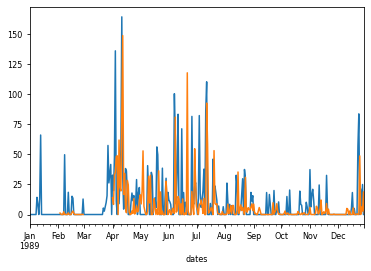

In [257]:
dailydata6.loc["1989-01-01":"1989-12-30", ["00734008","00734006"]].plot(legend = False)

In [258]:
dailydata6.loc["1985-01-01":"1985", ["00734008","00734006"]].head(50)

,00734008,00734006
dates,,
1985-01-01,0.0,0.0
1985-01-02,0.0,2.4
1985-01-03,0.0,0.0
1985-01-04,0.0,0.5
1985-01-05,0.0,0.8
1985-01-06,8.7,5.1
1985-01-07,6.3,0.0
1985-01-08,6.2,6.7
1985-01-09,5.6,0.0


In [259]:
dailydata6.loc["1985":"1985", ["00734008","00734006"]].corr()

,00734008,00734006
00734008,1.0,0.7
00734006,0.7,1.0


Now we can set the daily values at those respective years for those two gauges to np.nan:

In [260]:
dailydata6.loc["1986": "1989", "00734008"] = np.nan

In [261]:
dailydata6.loc["1990", "01656004"] = np.nan

Here we can check the plots:

<AxesSubplot:xlabel='dates'>

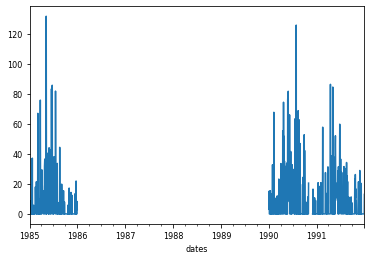

In [263]:
dailydata6.loc["1985" : "1991", "00734008"].plot()

<AxesSubplot:xlabel='dates'>

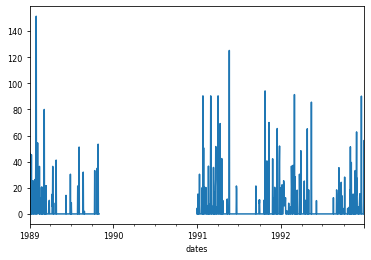

In [264]:
dailydata6.loc["1989":"1992", "01656004"].plot()

<AxesSubplot:xlabel='dates'>

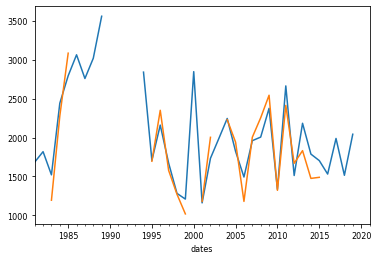

In [267]:
annualdata6.loc[:, ["00734008","00734006"]].plot(legend = False)

<AxesSubplot:xlabel='dates'>

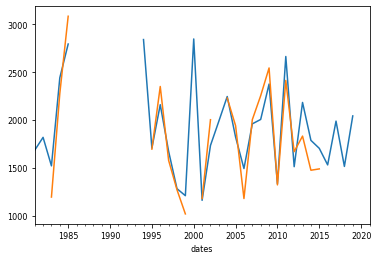

In [268]:
annualdata7.loc[:, ["00734008","00734006"]].plot(legend = False)

Now we can just save the new values:

In [265]:
dailydata7 = dailydata6.copy()

In [266]:
annualdata7 = dailydata6.resample('Y').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

In [188]:
monthdata7 = dailydata6.resample('M').agg(lambda x: np.nan if np.isnan(x).any() else np.sum(x))

In [190]:
dailydata6.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\dailydata7.csv')  
monthdata7.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\monthdata7.csv')  
annualdata7.to_csv(r'C:\Users\User\OneDrive\Projects\Y2022\SPI\cooperacao_raul_e_Thiago\datasets\gauges\annualdata7.csv')    

#####################################################################################################